 Apprentice Chef Inc data analysis

# Exploratory data analysis <br> & <br>
# Feature treatment and engineering

In [1]:
#%%timeit 

In [125]:
#importing all the necessary packages
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt# essential graphical 
import seaborn as sns # enhanced graphical 
import statsmodels.formula.api as smf # regression modeling
from sklearn.model_selection import train_test_split # train/test split
from sklearn.linear_model import LogisticRegression  # logistic regression
from sklearn.metrics import confusion_matrix         # confusion matrix
from sklearn.metrics import roc_auc_score            # auc score
from sklearn.neighbors import KNeighborsClassifier   # KNN for classification
from sklearn.neighbors import KNeighborsRegressor    # KNN for regression
from sklearn.preprocessing import StandardScaler     # standard scaler
# libraries for classification trees
from sklearn.tree import DecisionTreeClassifier      # classification trees
from sklearn.tree import export_graphviz             # exports graphics
from sklearn.externals.six import StringIO           # saves objects in memory
from IPython.display import Image                    # displays on frontend
import pydotplus                                     # interprets dot objects
from sklearn.model_selection import GridSearchCV     # hyperparameter tuning
from sklearn.metrics import make_scorer              # customizable scorer
from sklearn.ensemble import RandomForestClassifier     # random forest
from sklearn.ensemble import GradientBoostingClassifier # gbm



In [126]:

# setting pandas print options
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)


# nameing the file name as per assignment description
original_df = pd.read_excel('Apprentice_Chef_Dataset.xlsx')


# creating a copy with my preferred short name
chef = original_df.copy()
chef

,REVENUE,CROSS_SELL_SUCCESS,NAME,EMAIL,FIRST_NAME,FAMILY_NAME,TOTAL_MEALS_ORDERED,UNIQUE_MEALS_PURCH,CONTACTS_W_CUSTOMER_SERVICE,PRODUCT_CATEGORIES_VIEWED,AVG_TIME_PER_SITE_VISIT,MOBILE_NUMBER,CANCELLATIONS_BEFORE_NOON,CANCELLATIONS_AFTER_NOON,TASTES_AND_PREFERENCES,PC_LOGINS,MOBILE_LOGINS,WEEKLY_PLAN,EARLY_DELIVERIES,LATE_DELIVERIES,PACKAGE_LOCKER,REFRIGERATED_LOCKER,FOLLOWED_RECOMMENDATIONS_PCT,AVG_PREP_VID_TIME,LARGEST_ORDER_SIZE,MASTER_CLASSES_ATTENDED,MEDIAN_MEAL_RATING,AVG_CLICKS_PER_VISIT,TOTAL_PHOTOS_VIEWED
0,1880.0,1,Addam Osgrey,addam.osgrey@passport.com,Addam,Osgrey,118,4,7,5,86.00,1,2,1,0,6,2,8,0,2,1,0,90,165.8,6,1,3,11,0
1,1495.0,1,Aegon Blackfyre,aegon.blackfyre@jnj.com,Aegon,Blackfyre,44,3,6,3,125.60,1,0,1,0,6,1,8,0,4,1,0,90,150.5,4,1,3,13,90
2,2572.5,1,Aegon Frey (son of Aenys),aegon.frey.(son.of.aenys)@gmail.com,Aegon,Frey,38,1,5,3,58.00,1,5,0,1,6,2,14,0,0,0,0,80,99.6,3,0,3,12,0
3,1647.0,1,Aegon Targaryen (son of Rhaegar),aegon.targaryen.(son.of.rhaegar)@ibm.com,Aegon,Targaryen,76,3,8,10,45.51,0,3,0,1,6,1,11,5,4,0,0,90,125.0,3,0,3,13,0
4,1923.0,1,Aegon V Targaryen,aegon.v.targaryen@goldmansacs.com,Aegon,V Targaryen,65,3,6,9,106.00,1,1,1,0,6,2,12,0,4,1,0,90,135.3,3,1,3,13,253
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1941,1515.0,0,Yandry,yandry@yahoo.com,Yandry,Yandry,38,9,6,9,118.50,1,1,0,1,6,2,9,4,3,0,0,20,117.7,4,0,3,12,98
1942,1432.0,0,Yorkel,yorkel@gmail.com,Yorkel,Yorkel,47,8,4,8,105.30,0,0,0,1,5,3,6,0,2,0,0,20,98.1,3,0,3,13,0
1943,623.0,0,Young Henly,young.henly@gmail.com,Young,Henly,14,6,11,1,90.81,1,1,0,1,6,1,12,0,1,0,0,30,86.4,3,1,2,18,0
1944,899.0,0,Ysilla,ysilla@protonmail.com,Ysilla,Ysilla,15,4,12,6,97.22,1,0,0,0,6,2,52,4,3,0,0,20,86.9,1,0,2,17,0


In [180]:
# loading the dictionary for more reference
chef_description = pd.read_excel('Apprentice_Chef_Data_Dictionary.xlsx')
chef_description

,Column,Data Type,Description
0,REVENUE,float,Total revenue generated over the first year of...
1,CROSS_SELL_SUCCESS,integer,Success of promoting Halfway There (1 = SUCCES...
2,NAME,string,Full name of customer (collected upon initial ...
3,EMAIL,string,Email of customer (collected upon initial regi...
4,FIRST_NAME,string,First name of customer (collected upon initial...
5,FAMILY_NAME,string,Last name of customer (collected upon initial ...
6,TOTAL_MEALS_ORDERED,integer,Total count of meals ordered per customer account
7,UNIQUE_MEALS_PURCH,integer,Count of unique meal sets ordered per customer...
8,CONTACTS_W_CUSTOMER_SERVICE,integer,Count of times a customer made contact with cu...
9,PRODUCT_CATEGORIES_VIEWED,integer,Total number of meal categories viewed (online...


In [107]:
#to check how the data looks like at a glance
#chef.head(n=10)

In [62]:
chef.iloc[:,1:].describe()

,CROSS_SELL_SUCCESS,TOTAL_MEALS_ORDERED,UNIQUE_MEALS_PURCH,CONTACTS_W_CUSTOMER_SERVICE,PRODUCT_CATEGORIES_VIEWED,AVG_TIME_PER_SITE_VISIT,MOBILE_NUMBER,CANCELLATIONS_BEFORE_NOON,CANCELLATIONS_AFTER_NOON,TASTES_AND_PREFERENCES,PC_LOGINS,MOBILE_LOGINS,WEEKLY_PLAN,EARLY_DELIVERIES,LATE_DELIVERIES,PACKAGE_LOCKER,REFRIGERATED_LOCKER,FOLLOWED_RECOMMENDATIONS_PCT,AVG_PREP_VID_TIME,LARGEST_ORDER_SIZE,MASTER_CLASSES_ATTENDED,MEDIAN_MEAL_RATING,AVG_CLICKS_PER_VISIT,TOTAL_PHOTOS_VIEWED
count,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000,1946.000000
mean,0.678828,74.634121,4.904933,6.983556,5.383864,99.604651,0.877698,1.404933,0.165982,0.714286,5.515930,1.476362,11.329908,1.486125,2.970709,0.355087,0.113052,35.411100,150.556578,4.436793,0.604317,2.794964,13.508222,106.433710
std,0.467047,55.309782,2.502175,2.281193,3.044001,62.341756,0.327719,1.549677,0.432241,0.451870,0.580757,0.527600,13.573303,2.318599,2.744598,0.478663,0.316738,26.577927,49.447180,1.550972,0.641866,0.756528,2.333876,181.014124
min,0.000000,11.000000,1.000000,1.000000,1.000000,10.330000,0.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,33.400000,0.000000,0.000000,1.000000,5.000000,0.000000
25%,0.000000,39.000000,3.000000,5.000000,3.000000,72.000000,1.000000,0.000000,0.000000,0.000000,5.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,10.000000,114.400000,3.000000,0.000000,2.000000,12.000000,0.000000
50%,1.000000,60.000000,5.000000,7.000000,5.000000,94.160000,1.000000,1.000000,0.000000,1.000000,6.000000,1.000000,7.000000,0.000000,2.000000,0.000000,0.000000,30.000000,145.600000,4.000000,1.000000,3.000000,13.000000,0.000000
75%,1.000000,95.000000,7.000000,8.000000,8.000000,117.287500,1.000000,2.000000,0.000000,1.000000,6.000000,2.000000,13.000000,3.000000,4.000000,1.000000,0.000000,60.000000,173.775000,5.000000,1.000000,3.000000,15.000000,174.000000
max,1.000000,493.000000,19.000000,18.000000,10.000000,1645.600000,1.000000,13.000000,3.000000,1.000000,7.000000,3.000000,52.000000,9.000000,19.000000,1.000000,1.000000,90.000000,564.200000,11.000000,3.000000,5.000000,19.000000,1600.000000


In [109]:
chef.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1946 entries, 0 to 1945
Data columns (total 29 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   REVENUE                       1946 non-null   float64
 1   CROSS_SELL_SUCCESS            1946 non-null   int64  
 2   NAME                          1946 non-null   object 
 3   EMAIL                         1946 non-null   object 
 4   FIRST_NAME                    1946 non-null   object 
 5   FAMILY_NAME                   1899 non-null   object 
 6   TOTAL_MEALS_ORDERED           1946 non-null   int64  
 7   UNIQUE_MEALS_PURCH            1946 non-null   int64  
 8   CONTACTS_W_CUSTOMER_SERVICE   1946 non-null   int64  
 9   PRODUCT_CATEGORIES_VIEWED     1946 non-null   int64  
 10  AVG_TIME_PER_SITE_VISIT       1946 non-null   float64
 11  MOBILE_NUMBER                 1946 non-null   int64  
 12  CANCELLATIONS_BEFORE_NOON     1946 non-null   int64  
 13  CAN

In [110]:
chef.isnull().sum()

REVENUE                          0
CROSS_SELL_SUCCESS               0
NAME                             0
EMAIL                            0
FIRST_NAME                       0
FAMILY_NAME                     47
TOTAL_MEALS_ORDERED              0
UNIQUE_MEALS_PURCH               0
CONTACTS_W_CUSTOMER_SERVICE      0
PRODUCT_CATEGORIES_VIEWED        0
AVG_TIME_PER_SITE_VISIT          0
MOBILE_NUMBER                    0
CANCELLATIONS_BEFORE_NOON        0
CANCELLATIONS_AFTER_NOON         0
TASTES_AND_PREFERENCES           0
PC_LOGINS                        0
MOBILE_LOGINS                    0
WEEKLY_PLAN                      0
EARLY_DELIVERIES                 0
LATE_DELIVERIES                  0
PACKAGE_LOCKER                   0
REFRIGERATED_LOCKER              0
FOLLOWED_RECOMMENDATIONS_PCT     0
AVG_PREP_VID_TIME                0
LARGEST_ORDER_SIZE               0
MASTER_CLASSES_ATTENDED          0
MEDIAN_MEAL_RATING               0
AVG_CLICKS_PER_VISIT             0
TOTAL_PHOTOS_VIEWED 

Although I am not sure about the impact on my model, I will impute it as unknown. It is good to impute because it would increase training model efficiency.


In [127]:
chef['FAMILY_NAME']= chef['FAMILY_NAME'].fillna('Unknown')
#checking for final missing value treatment
chef.isnull().sum()

REVENUE                         0
CROSS_SELL_SUCCESS              0
NAME                            0
EMAIL                           0
FIRST_NAME                      0
FAMILY_NAME                     0
TOTAL_MEALS_ORDERED             0
UNIQUE_MEALS_PURCH              0
CONTACTS_W_CUSTOMER_SERVICE     0
PRODUCT_CATEGORIES_VIEWED       0
AVG_TIME_PER_SITE_VISIT         0
MOBILE_NUMBER                   0
CANCELLATIONS_BEFORE_NOON       0
CANCELLATIONS_AFTER_NOON        0
TASTES_AND_PREFERENCES          0
PC_LOGINS                       0
MOBILE_LOGINS                   0
WEEKLY_PLAN                     0
EARLY_DELIVERIES                0
LATE_DELIVERIES                 0
PACKAGE_LOCKER                  0
REFRIGERATED_LOCKER             0
FOLLOWED_RECOMMENDATIONS_PCT    0
AVG_PREP_VID_TIME               0
LARGEST_ORDER_SIZE              0
MASTER_CLASSES_ATTENDED         0
MEDIAN_MEAL_RATING              0
AVG_CLICKS_PER_VISIT            0
TOTAL_PHOTOS_VIEWED             0
dtype: int64

* The following regression is only to get the correlation as an overview of the variables and this is by no means a sufficient source for judgment.

In [26]:
#without doing all simple regressions, we can have correlations here
chef_corr = chef.corr().round(2)

chef_corr['CROSS_SELL_SUCCESS'].sort_values(ascending = False)

CROSS_SELL_SUCCESS              1.00
FOLLOWED_RECOMMENDATIONS_PCT    0.46
CANCELLATIONS_BEFORE_NOON       0.16
MOBILE_NUMBER                   0.10
TASTES_AND_PREFERENCES          0.08
REFRIGERATED_LOCKER             0.07
MASTER_CLASSES_ATTENDED         0.04
PACKAGE_LOCKER                  0.04
CONTACTS_W_CUSTOMER_SERVICE     0.04
PC_LOGINS                       0.04
MEDIAN_MEAL_RATING              0.03
AVG_PREP_VID_TIME               0.03
LARGEST_ORDER_SIZE              0.02
EARLY_DELIVERIES                0.02
TOTAL_PHOTOS_VIEWED             0.01
LATE_DELIVERIES                 0.01
TOTAL_MEALS_ORDERED             0.01
AVG_TIME_PER_SITE_VISIT         0.01
UNIQUE_MEALS_PURCH              0.00
REVENUE                         0.00
PRODUCT_CATEGORIES_VIEWED       0.00
WEEKLY_PLAN                    -0.01
AVG_CLICKS_PER_VISIT           -0.04
CANCELLATIONS_AFTER_NOON       -0.05
MOBILE_LOGINS                  -0.05
Name: CROSS_SELL_SUCCESS, dtype: float64

Based on some research on the topic, we want to get more clear on some variables, so we use some interactions and ratios based on the variables to get more into the topic. <br>
    _So, I will define variables that are more describing the success of cross sell._

In [128]:
#defining a variable to see what combination of the rating was, as result of following our recommendations
chef['rate_recom']= chef['MEDIAN_MEAL_RATING']*chef['FOLLOWED_RECOMMENDATIONS_PCT']

In [129]:
#define variables based on how customers spend time on website
chef['time_spent_web']= chef['AVG_PREP_VID_TIME']/chef['AVG_TIME_PER_SITE_VISIT']

In [130]:
#define new variable to understand to what level customers are willing to try new things!
chef['try_new']= chef['UNIQUE_MEALS_PURCH']/chef['TOTAL_MEALS_ORDERED']


In [131]:
#define a new variable that gives us a proportion to size of meals
chef['order_size']= chef['LARGEST_ORDER_SIZE']/chef['TOTAL_MEALS_ORDERED']

In [132]:
#define a variable that goes through how unsatisfied they were based on contacts on contacts
chef['satisfy']= chef['TOTAL_MEALS_ORDERED']/chef['CONTACTS_W_CUSTOMER_SERVICE']


In [133]:
# ratio of total meals and cancellations after noon because we fully refund
chef['cancel']= chef['CANCELLATIONS_BEFORE_NOON']/chef['TOTAL_MEALS_ORDERED']


In [134]:
#defining variable to see how ratings led to cancellations
chef['rate_result'] = chef['MEDIAN_MEAL_RATING']*(chef['CANCELLATIONS_AFTER_NOON']+chef['CANCELLATIONS_BEFORE_NOON'])


In [135]:
#defining a variable to see average customer revenue
chef['rev_cust']=chef['REVENUE']/chef['TOTAL_MEALS_ORDERED']

Adding a column to analyze the domain of custommers' email addresses.Infromation could be regarding where can we concentrate our advertisements or reach outs

In [136]:
#analyzing the email addresses
placeholder_lst = []

# looping over each email address
for index, col in chef.iterrows():
    
    # splitting email domain at '@'
    split_email = chef.loc[index, 'EMAIL'].split(sep = '@')
    
    # appending placeholder_lst with the results
    placeholder_lst.append(split_email)
    

# converting placeholder_lst into a DataFrame 
emails_df = pd.DataFrame(placeholder_lst)


# displaying the results
emails_df

,0,1
0,addam.osgrey,passport.com
1,aegon.blackfyre,jnj.com
2,aegon.frey.(son.of.aenys),gmail.com
3,aegon.targaryen.(son.of.rhaegar),ibm.com
4,aegon.v.targaryen,goldmansacs.com
...,...,...
1941,yandry,yahoo.com
1942,yorkel,gmail.com
1943,young.henly,gmail.com
1944,ysilla,protonmail.com


In [137]:

# renaming column to concatenate
emails_df.columns= ['name_in_email' , 'email_domain']


# concatenating personal_email_domain with friends DataFrame
chef = pd.concat([chef, emails_df['email_domain']],
                   axis = 1)


# printing value counts of personal_email_domain
chef.loc[: ,'email_domain'].value_counts()

gmail.com           303
protonmail.com      284
yahoo.com           274
msn.com              72
aol.com              69
passport.com         64
hotmail.com          63
live.com             62
me.com               59
amex.com             30
cocacola.com         28
mcdonalds.com        28
jnj.com              28
merck.com            28
nike.com             27
apple.com            27
dupont.com           26
ge.org               26
ibm.com              26
chevron.com          25
microsoft.com        25
exxon.com            24
travelers.com        24
unitedhealth.com     24
boeing.com           23
caterpillar.com      22
verizon.com          22
pg.com               22
mmm.com              22
disney.com           21
walmart.com          21
pfizer.com           20
visa.com             20
jpmorgan.com         19
goldmansacs.com      18
cisco.com            18
unitedtech.com       18
intel.com            17
homedepot.com        17
Name: email_domain, dtype: int64

In [138]:
professional = ['mmm.com','amex.com','apple.com','boeing.com','caterpillar.com',
'chevron.com','cisco.com',
'cocacola.com','disney.com','dupont.com','exxon.com','ge.org','goldmansacs.com',
'homedepot.com','ibm.com','intel.com','jnj.com','jpmorgan.com','mcdonalds.com',
'merck.com','microsoft.com','nike.com','pfizer.com','pg.com','travelers.com',
'unitedtech.com','unitedhealth.com','verizon.com','visa.com','walmart.com']
personal  = ['gmail.com','yahoo.com','protonmail.com']
junk = ['me.com','aol.com','hotmail.com','live.com','msn.com','passport.com']

#placeholder list
placeholder_lst = []


# looping to group observations by domain type
for domain in chef['email_domain']:
        if domain in personal:
            placeholder_lst.append('personal')
            
        elif domain in professional :
          placeholder_lst.append('professional')
            
        elif domain in junk :
            placeholder_lst.append('junk')
            
        else:
           print('Unknown')


# joining this to the original DataFrame
chef['domain_class'] = pd.Series(placeholder_lst)

chef['domain_class']

0               junk
1       professional
2           personal
3       professional
4       professional
            ...     
1941        personal
1942        personal
1943        personal
1944        personal
1945            junk
Name: domain_class, Length: 1946, dtype: object

In [139]:
#one-hot-encoding on domain class to change the categorical type of email domains
one_hot_domain       = pd.get_dummies(chef['domain_class'])
chef = chef.drop('domain_class',axis=1)
chef = chef.join([one_hot_domain])

In [42]:
#to continue with feature engineering, we need to visualize the variables
chef.columns

Index(['REVENUE', 'CROSS_SELL_SUCCESS', 'NAME', 'EMAIL', 'FIRST_NAME', 'FAMILY_NAME', 'TOTAL_MEALS_ORDERED', 'UNIQUE_MEALS_PURCH', 'CONTACTS_W_CUSTOMER_SERVICE', 'PRODUCT_CATEGORIES_VIEWED', 'AVG_TIME_PER_SITE_VISIT', 'MOBILE_NUMBER', 'CANCELLATIONS_BEFORE_NOON', 'CANCELLATIONS_AFTER_NOON', 'TASTES_AND_PREFERENCES', 'PC_LOGINS', 'MOBILE_LOGINS', 'WEEKLY_PLAN', 'EARLY_DELIVERIES', 'LATE_DELIVERIES', 'PACKAGE_LOCKER', 'REFRIGERATED_LOCKER', 'FOLLOWED_RECOMMENDATIONS_PCT', 'AVG_PREP_VID_TIME', 'LARGEST_ORDER_SIZE', 'MASTER_CLASSES_ATTENDED', 'MEDIAN_MEAL_RATING', 'AVG_CLICKS_PER_VISIT', 'TOTAL_PHOTOS_VIEWED', 'rate_recom', 'time_spent_web', 'try_new', 'order_size', 'satisfy', 'cancel', 'rate_result', 'rev_cust', 'email_domain', 'junk', 'personal', 'professional'], dtype='object')

In [43]:
#to use the list for a for loop to plot (removing objects types)
chef_plot=['REVENUE', 'CROSS_SELL_SUCCESS', 'TOTAL_MEALS_ORDERED', 'UNIQUE_MEALS_PURCH',
           'CONTACTS_W_CUSTOMER_SERVICE', 'PRODUCT_CATEGORIES_VIEWED', 'AVG_TIME_PER_SITE_VISIT',
           'MOBILE_NUMBER', 'CANCELLATIONS_BEFORE_NOON', 'CANCELLATIONS_AFTER_NOON', 'TASTES_AND_PREFERENCES',
           'PC_LOGINS', 'MOBILE_LOGINS', 'WEEKLY_PLAN', 'EARLY_DELIVERIES', 'LATE_DELIVERIES', 'PACKAGE_LOCKER',
           'REFRIGERATED_LOCKER', 'FOLLOWED_RECOMMENDATIONS_PCT', 'AVG_PREP_VID_TIME', 'LARGEST_ORDER_SIZE',
           'MASTER_CLASSES_ATTENDED', 'MEDIAN_MEAL_RATING', 'AVG_CLICKS_PER_VISIT', 'TOTAL_PHOTOS_VIEWED', 
           'time_spent_web', 'try_new', 'order_size', 'satisfy', 'cancel', 'rate_result', 'rev_cust', 'rate_recom', 
            'junk', 'personal', 'professional']

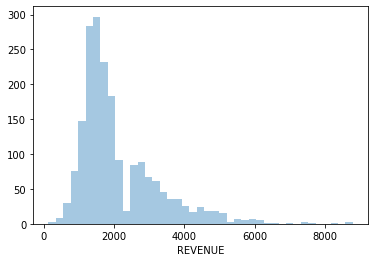

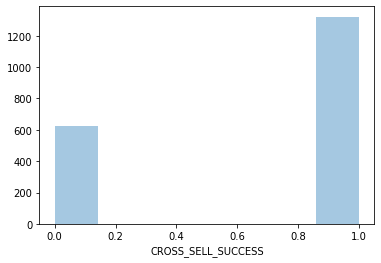

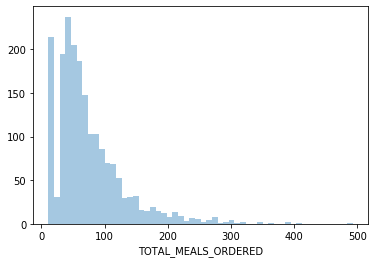

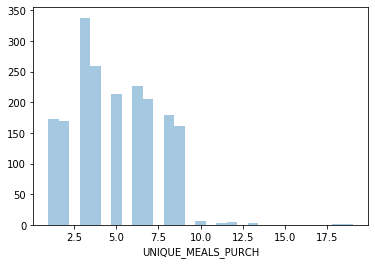

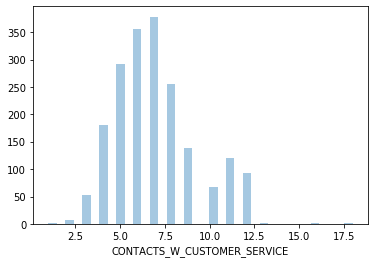

...

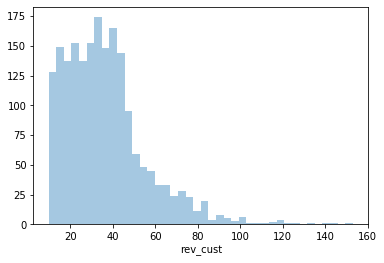

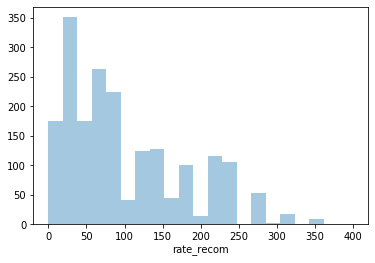

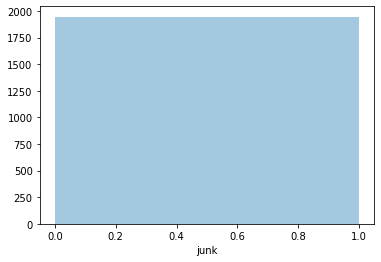

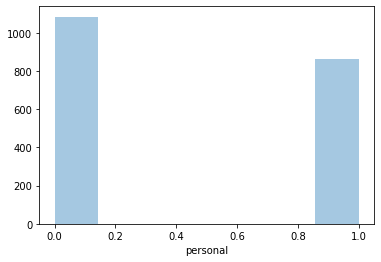

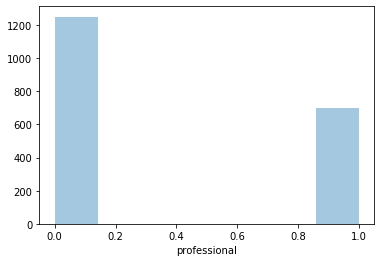

In [131]:
for i in chef_plot:
    sns.distplot(chef[i], bins = 'fd', kde=False)
    plt.xlabel(i)
    plt.show()

In [140]:
# setting outlier thresholds
total_meal_hi         = 30 
unique_meal_hi        = 10
contacts_customer_lo  = 2.5
contacts_customer_hi  = 12
product_view_lo_1     = 1
product_view_hi_1     = 3.1
product_view_lo_2     = 4
product_view_hi_2     = 6.1
product_view_lo_3     = 7
product_view_hi_3     = 10
time_visit_hi         = 265
cancel_before_noon_hi = 7
pc_login_hi           = 7
weekly_plan_hi        = 20
early_del_hi          = 9
late_del_hi           = 13
flw_recom_hi          = 90
prep_video_time_hi    = 300
prep_video_time_lo    = 50
#largest_order_hi      = 10
#largest_order_lo      = 1
meal_rating_hi        = 4
click_per_visit_lo    = 8
click_per_visit_hi    = 19
total_photo_hi        = 490
order_size_hi         = 0.31
revenue_hi            = 6000



##############################################################################
## Feature Engineering (outlier thresholds)                                 ##
##############################################################################

# developing features (columns) for outliers

# total meals ordered
chef['out_total_meal'] = 0
num_hi = chef.loc[0:,'out_total_meal'][chef['TOTAL_MEALS_ORDERED'] > total_meal_hi]

chef['out_total_meal'].replace(to_replace = num_hi,
                                value      = 1,
                                inplace    = True)

# unique meals purchased
chef['out_unique_meal'] = 0
num_hi = chef.loc[0:,'out_unique_meal'][chef['UNIQUE_MEALS_PURCH'] > unique_meal_hi]

chef['out_unique_meal'].replace(to_replace = num_hi,
                                value      = 1,
                                inplace    = True)
# contact customer services
chef['out_contact_customer'] = 0
num_hi = chef.loc[0:,'out_contact_customer'][chef['CONTACTS_W_CUSTOMER_SERVICE'] > contacts_customer_hi]
num_lo = chef.loc[0:,'out_contact_customer'][chef['CONTACTS_W_CUSTOMER_SERVICE'] < contacts_customer_lo]

chef['out_contact_customer'].replace(to_replace = num_hi,
                                    value      = 1,
                                    inplace    = True)

chef['out_contact_customer'].replace(to_replace = num_lo,
                                    value      = 1,
                                    inplace    = True)

#product view categories
chef['out_product_view'] = 0
num_hi = chef.loc[0:,'out_product_view'][chef['PRODUCT_CATEGORIES_VIEWED'] > product_view_hi_3]
num_lo = chef.loc[0:,'out_product_view'][chef['PRODUCT_CATEGORIES_VIEWED'] < product_view_lo_1]

chef['out_product_view'].replace(to_replace = num_hi,
                                    value      = 1,
                                    inplace    = True)

chef['out_product_view'].replace(to_replace = num_lo,
                                    value      = 1,
                                    inplace    = True)
# product view category
chef['out_product_view_1'] = 0
num_hi = chef.loc[0:,'out_product_view_1'][chef['PRODUCT_CATEGORIES_VIEWED'] > product_view_hi_2]
num_lo = chef.loc[0:,'out_product_view_1'][chef['PRODUCT_CATEGORIES_VIEWED'] < product_view_lo_3]

chef['out_product_view_1'].replace(to_replace = num_hi,
                                    value      = 1,
                                    inplace    = True)

chef['out_product_view_1'].replace(to_replace = num_lo,
                                    value      = 1,
                                    inplace    = True)

# product view category
chef['out_product_view_2'] = 0
num_hi = chef.loc[0:,'out_product_view_2'][chef['PRODUCT_CATEGORIES_VIEWED'] > product_view_hi_1]
num_lo = chef.loc[0:,'out_product_view_2'][chef['PRODUCT_CATEGORIES_VIEWED'] < product_view_lo_2]

chef['out_product_view_2'].replace(to_replace = num_hi,
                                    value      = 1,
                                    inplace    = True)

chef['out_product_view_2'].replace(to_replace = num_lo,
                                    value      = 1,
                                    inplace    = True)



# Average time per visit on the website
chef['out_time_visit'] = 0
num_hi = chef.loc[0:,'out_time_visit'][chef['AVG_TIME_PER_SITE_VISIT'] > time_visit_hi]

chef['out_time_visit'].replace(to_replace = num_hi,
                                    value      = 1,
                                    inplace    = True)
# cancel before noon
chef['out_cancel_before'] = 0
num_hi = chef.loc[0:,'out_cancel_before'][chef['CANCELLATIONS_BEFORE_NOON'] > cancel_before_noon_hi]

chef['out_cancel_before'].replace(to_replace = num_hi,
                                    value      = 1,
                                    inplace    = True)

#pc login

chef['out_pc_login'] = 0
num_hi = chef.loc[0:,'out_pc_login'][chef['PC_LOGINS'] > pc_login_hi]

chef['out_pc_login'].replace(to_replace = num_hi,
                                    value      = 1,
                                    inplace    = True)
#weekly plan subscribed

chef['out_weekly_plan'] = 0
num_hi = chef.loc[0:,'out_weekly_plan'][chef['WEEKLY_PLAN'] > weekly_plan_hi]

chef['out_weekly_plan'].replace(to_replace = num_hi,
                                    value      = 1,
                                    inplace    = True)
#Early delivery
chef['out_early_del'] = 0
num_hi = chef.loc[0:,'out_early_del'][chef['EARLY_DELIVERIES'] > early_del_hi]

chef['out_early_del'].replace(to_replace = num_hi,
                                    value      = 1,
                                    inplace    = True)

#late deliveries

chef['out_late_del'] = 0
num_hi = chef.loc[0:,'out_late_del'][chef['LATE_DELIVERIES'] > late_del_hi]

chef['out_late_del'].replace(to_replace = num_hi,
                                    value      = 1,
                                    inplace    = True)

#FOLLOWED_RECOMMENDATIONS_PCT

chef['out_flw_recom'] = 0
num_hi = chef.loc[0:,'out_flw_recom'][chef['FOLLOWED_RECOMMENDATIONS_PCT'] > flw_recom_hi]

chef['out_flw_recom'].replace(to_replace = num_hi,
                                    value      = 1,
                                    inplace    = True)

# prep video time
chef['out_prep_video'] = 0
num_hi = chef.loc[0:,'out_prep_video'][chef['AVG_PREP_VID_TIME'] > prep_video_time_hi]
num_lo = chef.loc[0:,'out_prep_video'][chef['AVG_PREP_VID_TIME'] < prep_video_time_lo]

chef['out_prep_video'].replace(to_replace = num_hi,
                                    value      = 1,
                                    inplace    = True)

chef['out_prep_video'].replace(to_replace = num_lo,
                                    value      = 1,
                                    inplace    = True)


# largest order size
#chef['out_largest_order'] = 0
#num_hi = chef.loc[0:,'out_largest_order'][chef['LARGEST_ORDER_SIZE'] > largest_order_hi]
#num_lo = chef.loc[0:,'out_largest_order'][chef['LARGEST_ORDER_SIZE'] < largest_order_lo]

#chef['out_largest_order'].replace(to_replace = num_hi,
                                    #value      = 1,
                                    #inplace    = True)

#chef['out_largest_order'].replace(to_replace = num_lo,
                                    #value      = 1,
                                    #inplace    = True)


# Revenue
chef['out_revenue'] = 0
num_hi = chef.loc[0:,'out_revenue'][chef['REVENUE'] > revenue_hi]

chef['out_revenue'].replace(to_replace = num_hi,
                                 value      = 1,
                                 inplace    = True)


#median of meal rating
chef['out_med_meal'] = 0
num_hi = chef.loc[0:,'out_med_meal'][chef['MEDIAN_MEAL_RATING'] > meal_rating_hi]

chef['out_med_meal'].replace(to_replace = num_hi,
                                value      = 1,
                                inplace    = True)

#Average clicks per visit

chef['out_click_visit'] = 0
num_hi = chef.loc[0:,'out_click_visit'][chef['AVG_CLICKS_PER_VISIT'] > click_per_visit_hi]
num_lo = chef.loc[0:,'out_click_visit'][chef['AVG_CLICKS_PER_VISIT'] < click_per_visit_lo]

chef['out_click_visit'].replace(to_replace = num_hi,
                                    value      = 1,
                                    inplace    = True)

chef['out_click_visit'].replace(to_replace = num_lo,
                                    value      = 1,
                                    inplace    = True)
#total photos viewed

chef['out_photo_viewed'] = 0
num_hi = chef.loc[0:,'out_photo_viewed'][chef['TOTAL_PHOTOS_VIEWED'] > total_photo_hi]

chef['out_photo_viewed'].replace(to_replace = num_hi,
                                value      = 1,
                                inplace    = True)
#order size

chef['out_order_size'] = 0
num_hi = chef.loc[0:,'out_order_size'][chef['order_size'] > order_size_hi]

chef['out_order_size'].replace(to_replace = num_hi,
                                value      = 1,
                                inplace    = True)


We have developed thresholds for possible outliers. Now, to check the trend, we develope boxplots for the relations with CROSS_SELL_SUCCESS

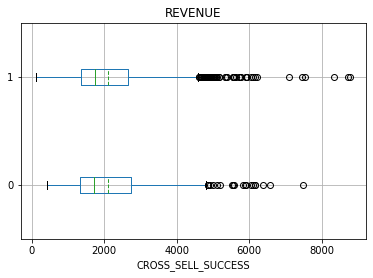

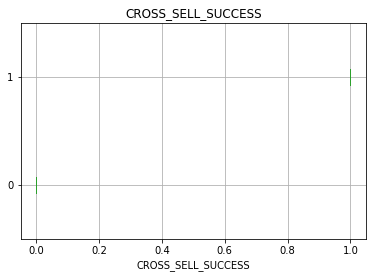

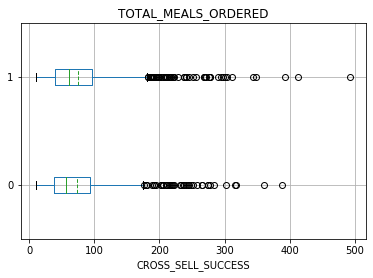

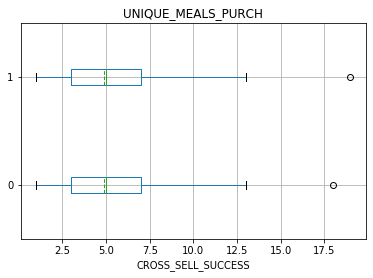

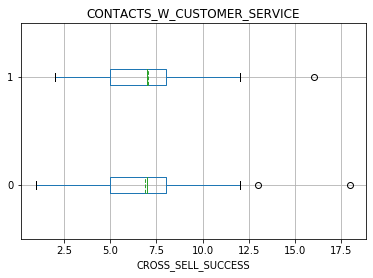

...

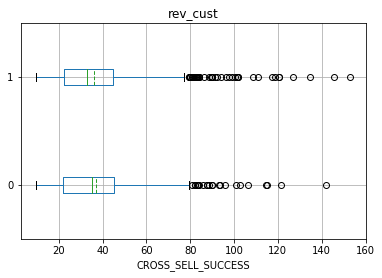

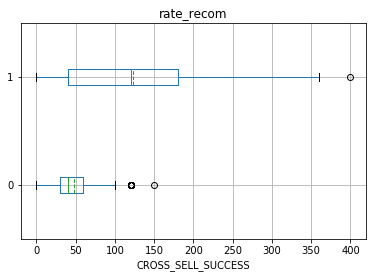

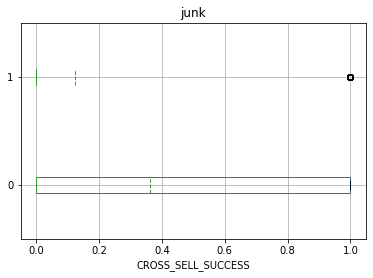

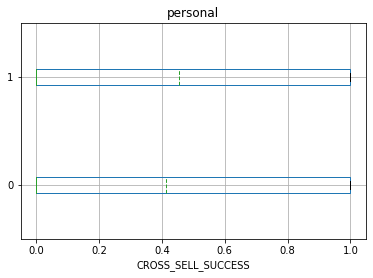

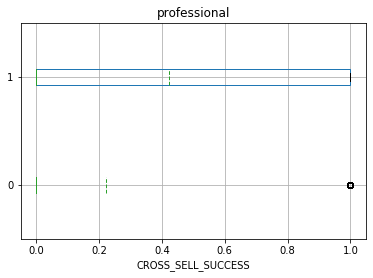

In [328]:
def cross_boxplots( var,response, data):
    """
	This function can be used for categorical variables

	PARAMETERS
	----------
	response : str, response variable
	cat_var  : str, categorical variable
	data     : DataFrame of the response and categorical variables
	"""

    data.boxplot(column 	     = var,
    	            by 	 		 = response,
        	        vert 	     = False,
            	    patch_artist = False,
                	meanline     = True,
               		showmeans    = True)

    plt.suptitle("")
    plt.show()


# calling the function for each variable 
for i in chef_plot:
    cross_boxplots(var = i,
					 response = 'CROSS_SELL_SUCCESS',
					 data     = chef)


Guide: Instead of scatter plots, we have used the boxplots to visualize the trend changes and in case it includes outliers (Note: our main focus is __not__ the outliers) <br> In addition to the feature engineering process, this would help to find some hidden information regarding each variable according to cross_sell_success

Here, we apply the identified outliers or trend changers into the dataset 

In [141]:
##############################################################################
## Feature Engineering (trend changes and outliers)                         
##############################################################################

# developing features (columns) for outliers
revenue_change       = 2800
total_meals_change   = 85
unique_meals_change  = 12
contacts_w_change    = 9
time_visit_change    = 140
cancel_before_change = 2 # the ones who canceled has ordered that meal too
weekly_plan_change   = 13
late_del_change      = 4
flw_recom_change_lo  = 19
flw_recom_change_hi  = 45
prep_video_change    = 180
large_order_change   = 5
meal_rating_change   = 3
#clicks per visit
photo_view_change    = 190
time_spent_change    = 2
try_new_change       = 0.12
satisfy_change       = 15
cancel_change        = 0.05
rate_result_change   = 7
rate_recom_change    = 150


# for revenue
chef['change_revenue'] = 0
num = chef.loc[0:,'change_revenue'][chef['REVENUE'] > revenue_change]

chef['change_revenue'].replace(to_replace = num,
                                     value      = 1,
                                     inplace    = True)



# total meals ordered (scattered data)
chef['change_total_meals'] = 0
num = chef.loc[0:,'change_total_meals'][chef['TOTAL_MEALS_ORDERED'] > total_meals_change]

chef['change_total_meals'].replace(to_replace = num,
                                   value      = 1,
                                   inplace    = True)

# contact with customer services

chef['change_contact_customer'] = 0
num = chef.loc[0:,'change_contact_customer'][chef['CONTACTS_W_CUSTOMER_SERVICE'] > contacts_w_change]

chef['change_contact_customer'].replace(to_replace = num,
                                   value      = 1,
                                   inplace    = True)

#unique meals purchased
chef['change_unique_meal'] = 0
num = chef.loc[0:,'change_unique_meal'][chef['UNIQUE_MEALS_PURCH'] > unique_meals_change]

chef['change_unique_meal'].replace(to_replace = num,
                                   value      = 1,
                                   inplace    = True)

#average time per visit on the web

chef['change_time_visit'] = 0
num = chef.loc[0:,'change_time_visit'][chef['AVG_TIME_PER_SITE_VISIT'] > time_visit_change]

chef['change_time_visit'].replace(to_replace = num,
                                   value      = 1,
                                   inplace    = True)
#cancel before noon

chef['change_cancel_before'] = 0
num = chef.loc[0:,'change_cancel_before'][chef['CANCELLATIONS_BEFORE_NOON'] > cancel_before_change]

chef['change_cancel_before'].replace(to_replace = num,
                                   value      = 1,
                                   inplace    = True)

#weekly plan
chef['change_weekly'] = 0
num = chef.loc[0:,'change_weekly'][chef['WEEKLY_PLAN'] > weekly_plan_change]

chef['change_weekly'].replace(to_replace = num,
                                   value      = 1,
                                   inplace    = True)
#late delivery
chef['change_late_del'] = 0
num = chef.loc[0:,'change_weekly'][chef['LATE_DELIVERIES'] > late_del_change]

chef['change_late_del'].replace(to_replace = num,
                                   value      = 1,
                                   inplace    = True)
#average time spent on prep video

chef['change_prep_video'] = 0
num = chef.loc[0:,'change_prep_video'][chef['AVG_PREP_VID_TIME'] > prep_video_change]

chef['change_prep_video'].replace(to_replace = num,
                                   value      = 1,
                                   inplace    = True)
#LARGEST_ORDER_SIZE
chef['change_large_order'] = 0
num = chef.loc[0:,'change_large_order'][chef['LARGEST_ORDER_SIZE'] > large_order_change]

chef['change_large_order'].replace(to_replace = num,
                                   value      = 1,
                                   inplace    = True)

#median meal rating
chef['change_meal_rate'] = 0
num = chef.loc[0:,'change_meal_rate'][chef['MEDIAN_MEAL_RATING'] > meal_rating_change]

chef['change_meal_rate'].replace(to_replace = num,
                                   value      = 1,
                                   inplace    = True)
#total photos viewed
chef['change_photo_view'] = 0
num = chef.loc[0:,'change_photo_view'][chef['TOTAL_PHOTOS_VIEWED'] > photo_view_change]

chef['change_photo_view'].replace(to_replace = num,
                                   value      = 1,
                                   inplace    = True)
#how time on web is spent
chef['change_time_spent'] = 0
num = chef.loc[0:,'change_time_spent'][chef['time_spent_web'] > time_spent_change]

chef['change_time_spent'].replace(to_replace = num,
                                   value      = 1,
                                   inplace    = True)
#trying new meals
chef['change_try_new'] = 0
num = chef.loc[0:,'change_try_new'][chef['try_new'] > try_new_change]

chef['change_try_new'].replace(to_replace = num,
                                   value      = 1,
                                   inplace    = True)
#satisfactory 
chef['change_satisfy'] = 0
num = chef.loc[0:,'change_satisfy'][chef['satisfy'] > satisfy_change]

chef['change_satisfy'].replace(to_replace = num,
                                   value      = 1,
                                   inplace    = True)
#total cancelations
chef['change_cancel'] = 0
num = chef.loc[0:,'change_cancel'][chef['cancel'] > cancel_change]

chef['change_cancel'].replace(to_replace = num,
                                   value      = 1,
                                   inplace    = True)
#rate result
chef['change_rate_result'] = 0
num = chef.loc[0:,'change_rate_result'][chef['rate_result'] > rate_result_change]

chef['change_rate_result'].replace(to_replace = num,
                                   value      = 1,
                                   inplace    = True)
#rate of followed recommendation
chef['change_rate_recom'] = 0
num = chef.loc[0:,'change_rate_recom'][chef['rate_recom'] > rate_recom_change]

chef['change_rate_recom'].replace(to_replace = num,
                                   value      = 1,
                                   inplace    = True)



Above is carefully created based on the box plots and anomalies like Changes in trend are spotted.


In [31]:

#import gender_guesser.detector as gender
#placeholder list
#placeholder_lst=[]


#looping to guess gender
#for name in chef['FIRST_NAME']:
    #guess = gender.Detector().get_gender(name)
    #print(guess)
    #placeholder_lst.append(guess)


#converting list into a series
#chef['gender_guess'] = pd.Series(placeholder_lst)


#checking results
#chef.loc[: ,'gender_guess'].value_counts()

The gender guess worked not very properly on this data set. In addition to the fact that it is so time consuming to run, it was not successful to guess most of the names. I have not added any column as a gender guess to my data set since it is not improving my model.
__However, I have counted the values and I have kept the result in here only as a reference to see what gender is buying more contributing to our revenue:<br>
unknown          1385 <br>
male              381 <br>
female            125 <br>
mostly_male        24 <br>
mostly_female      21 <br>
andy               10 <br>
Name: gender_guess, dtype: int64__

In [142]:
#analyzing the names
placeholder_lst = []

# looping over each name
for index, col in chef.iterrows():
    
    # splitting names and checking for length
    split_name = len(chef.loc[index, 'NAME'].split(sep = ' '))
    
    # appending placeholder_lst with the results
    placeholder_lst.append(split_name)
    

# converting placeholder_lst into a DataFrame and adding to chef
name_add = pd.DataFrame(placeholder_lst)
name_add.columns=['count_name']
chef=pd.concat([chef,name_add['count_name']],axis=1)

Later, I will check how this new variable of count of names will improve the model, same as other new variable.

In [143]:
#saving all the feature engineering process 
chef.to_excel('chef_featured.xlsx')

In [144]:
#quick check to see if there are unuseful variables created in feature engineering 
chef_corr=chef.corr().round(2)
chef_corr['CROSS_SELL_SUCCESS'].sort_values(ascending = False)

CROSS_SELL_SUCCESS              1.00
FOLLOWED_RECOMMENDATIONS_PCT    0.46
rate_recom                      0.43
change_rate_recom               0.39
professional                    0.19
count_name                      0.16
CANCELLATIONS_BEFORE_NOON       0.16
rate_result                     0.13
change_cancel_before            0.13
change_rate_result              0.12
cancel                          0.11
MOBILE_NUMBER                   0.10
change_cancel                   0.09
TASTES_AND_PREFERENCES          0.08
REFRIGERATED_LOCKER             0.07
PC_LOGINS                       0.04
PACKAGE_LOCKER                  0.04
personal                        0.04
CONTACTS_W_CUSTOMER_SERVICE     0.04
MASTER_CLASSES_ATTENDED         0.04
AVG_PREP_VID_TIME               0.03
out_cancel_before               0.03
change_contact_customer         0.03
out_med_meal                    0.03
MEDIAN_MEAL_RATING              0.03
out_total_meal                  0.03
EARLY_DELIVERIES                0.02
o

Before going to statsmodel, we notice that a few of variables should be removed simply because they are already NaN, and that we do not carry excessive noise. Further control will be done in logistic regression and statsmodel.<br>we will remove :<br>out_product_view                 NaN<br>
out_product_view_1               NaN<br>
out_product_view_2               NaN<br>
out_pc_login                     NaN<br>
out_early_del                    NaN<br>
out_flw_recom                    NaN<br>

In [145]:
#dropping the NaN
chef=chef.drop(['out_product_view','out_product_view_1','out_product_view_2',
               'out_pc_login','out_early_del','out_flw_recom'], axis=1)

In [146]:
#declaring the x variables
chef_data = chef.drop('CROSS_SELL_SUCCESS', axis = 1)


# declaring response variable
chef_target = chef.loc[ : , 'CROSS_SELL_SUCCESS']

In [147]:
# train-test split using stratification
X_train, X_test, y_train, y_test = train_test_split(
            chef_data,
            chef_target,
            test_size = 0.25,
            random_state = 508,
            stratify = chef_target)


# merging training data for statsmodels
chef_train = pd.concat([X_train, y_train], axis = 1)
# Training set 
print(X_train.shape)
print(y_train.shape)

# Testing set
print(X_test.shape)
print(y_test.shape)

(1459, 72)
(1459,)
(487, 72)
(487,)


In [148]:
# instantiating a logistic regression model for one single variable as an example
logistic_single = smf.logit(formula = """CROSS_SELL_SUCCESS ~ CANCELLATIONS_BEFORE_NOON""",
                           data    = chef_train)


# fitting the model object
results_logistic = logistic_single.fit()


# checking the results SUMMARY
results_logistic.summary()

Optimization terminated successfully.
         Current function value: 0.611673
         Iterations 5


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:     CROSS_SELL_SUCCESS   No. Observations:                 1459
Model:                          Logit   Df Residuals:                     1457
Method:                           MLE   Df Model:                            1
Date:                Sun, 15 Mar 2020   Pseudo R-squ.:                 0.02594
Time:                        11:46:28   Log-Likelihood:                -892.43
converged:                       True   LL-Null:                       -916.19
Covariance Type:            nonrobust   LLR p-value:                 5.428e-12
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept                     0.3875      0.076      5.097      0.000       0.238       0.536
CANCELLATIONS_BEFORE_NOON     0.2743      0.043      6.423      0.000       0.191       0.358
=============================================================================================
"""

In [204]:
chef.columns

Index(['REVENUE', 'CROSS_SELL_SUCCESS', 'NAME', 'EMAIL', 'FIRST_NAME', 'FAMILY_NAME', 'TOTAL_MEALS_ORDERED', 'UNIQUE_MEALS_PURCH', 'CONTACTS_W_CUSTOMER_SERVICE', 'PRODUCT_CATEGORIES_VIEWED', 'AVG_TIME_PER_SITE_VISIT', 'MOBILE_NUMBER', 'CANCELLATIONS_BEFORE_NOON', 'CANCELLATIONS_AFTER_NOON', 'TASTES_AND_PREFERENCES', 'PC_LOGINS', 'MOBILE_LOGINS', 'WEEKLY_PLAN', 'EARLY_DELIVERIES', 'LATE_DELIVERIES', 'PACKAGE_LOCKER', 'REFRIGERATED_LOCKER', 'FOLLOWED_RECOMMENDATIONS_PCT', 'AVG_PREP_VID_TIME', 'LARGEST_ORDER_SIZE', 'MASTER_CLASSES_ATTENDED', 'MEDIAN_MEAL_RATING', 'AVG_CLICKS_PER_VISIT', 'TOTAL_PHOTOS_VIEWED', 'time_spent_web', 'try_new', 'order_size', 'satisfy', 'cancel', 'rate_result', 'rev_cust', 'rate_recom', 'email_domain', 'junk', 'personal', 'professional', 'out_total_meal', 'out_unique_meal', 'out_contact_customer', 'out_time_visit', 'out_cancel_before', 'out_weekly_plan', 'out_late_del', 'out_prep_video', 'out_largest_order', 'out_revenue', 'out_med_meal', 'out_click_visit',
     

In the following part, I will determine the X train (the data that feeds the training model)<br>
Remember to remove variable with type of 'object'

In [207]:
x_variable = ['REVENUE', 'CROSS_SELL_SUCCESS','TOTAL_MEALS_ORDERED', 'UNIQUE_MEALS_PURCH', 'CONTACTS_W_CUSTOMER_SERVICE',
              'PRODUCT_CATEGORIES_VIEWED', 'AVG_TIME_PER_SITE_VISIT', 'MOBILE_NUMBER', 
              'CANCELLATIONS_BEFORE_NOON', 'CANCELLATIONS_AFTER_NOON', 'TASTES_AND_PREFERENCES',
              'PC_LOGINS', 'MOBILE_LOGINS', 'WEEKLY_PLAN', 'EARLY_DELIVERIES', 'LATE_DELIVERIES', 
              'PACKAGE_LOCKER', 'REFRIGERATED_LOCKER', 'FOLLOWED_RECOMMENDATIONS_PCT', 'AVG_PREP_VID_TIME',
              'LARGEST_ORDER_SIZE', 'MASTER_CLASSES_ATTENDED', 'MEDIAN_MEAL_RATING', 'AVG_CLICKS_PER_VISIT',
              'TOTAL_PHOTOS_VIEWED', 'time_spent_web', 'try_new', 'order_size', 'satisfy', 'cancel', 
              'rate_result', 'rev_cust', 'rate_recom', 'junk', 'personal', 'professional',
              'out_total_meal', 'out_unique_meal', 'out_contact_customer', 'out_time_visit',
              'out_cancel_before', 'out_weekly_plan', 'out_late_del', 'out_prep_video',
              'out_revenue', 'out_med_meal', 'out_click_visit','out_photo_viewed', 'out_order_size',
              'change_revenue', 'change_total_meals', 'change_contact_customer', 'change_unique_meal', 
              'change_time_visit', 'change_cancel_before', 'change_weekly', 'change_late_del', 
              'change_prep_video', 'change_large_order', 'change_meal_rate',
              'change_photo_view', 'change_time_spent', 'change_try_new', 'change_satisfy', 'change_cancel', 
              'change_rate_result', 'change_rate_recom','count_name']
# looping to make x-variables suitable for statsmodels
for val in x_variable:
    print(f"chef_train['{val}'] +")

chef_train['REVENUE'] +
chef_train['CROSS_SELL_SUCCESS'] +
chef_train['TOTAL_MEALS_ORDERED'] +
chef_train['UNIQUE_MEALS_PURCH'] +
chef_train['CONTACTS_W_CUSTOMER_SERVICE'] +
chef_train['PRODUCT_CATEGORIES_VIEWED'] +
chef_train['AVG_TIME_PER_SITE_VISIT'] +
chef_train['MOBILE_NUMBER'] +
chef_train['CANCELLATIONS_BEFORE_NOON'] +
chef_train['CANCELLATIONS_AFTER_NOON'] +
chef_train['TASTES_AND_PREFERENCES'] +
chef_train['PC_LOGINS'] +
chef_train['MOBILE_LOGINS'] +
chef_train['WEEKLY_PLAN'] +
chef_train['EARLY_DELIVERIES'] +
chef_train['LATE_DELIVERIES'] +
chef_train['PACKAGE_LOCKER'] +
chef_train['REFRIGERATED_LOCKER'] +
chef_train['FOLLOWED_RECOMMENDATIONS_PCT'] +
chef_train['AVG_PREP_VID_TIME'] +
chef_train['LARGEST_ORDER_SIZE'] +
chef_train['MASTER_CLASSES_ATTENDED'] +
chef_train['MEDIAN_MEAL_RATING'] +
chef_train['AVG_CLICKS_PER_VISIT'] +
chef_train['TOTAL_PHOTOS_VIEWED'] +
chef_train['time_spent_web'] +
chef_train['try_new'] +
chef_train['order_size'] +
chef_train['satisfy'] +
chef_tra

__Important note__: The statsmodel was not able to run at the beginning when I had all the possible variables included. The error that I was receiving was "singular matrix". Therefore, I noticed I have several variables that are having the same correlation. By looking at the corr function, I decided to remove all the zero correlations. Including:<br>
time_spent_web                 -0.00<br>
PRODUCT_CATEGORIES_VIEWED       0.00<br>
UNIQUE_MEALS_PURCH              0.00<br>
REVENUE                         0.00<br>
out_weekly_plan                -0.00<br>
out_late_del                   -0.00<br>
out_click_visit                -0.00<br>
change_time_visit               0.00<br>

In [149]:
#the full variable logistic statsmodel
#using the statsmodel to get the logistic statsmodel 
chef_train = pd.concat([X_train, y_train], axis = 1)
reg_log_full = smf.logit(formula = """CROSS_SELL_SUCCESS  ~ chef_train['TOTAL_MEALS_ORDERED'] +                          
                                                            
                                                            chef_train['CONTACTS_W_CUSTOMER_SERVICE'] +
                                                           
                                                            chef_train['AVG_TIME_PER_SITE_VISIT'] +
                                                            chef_train['MOBILE_NUMBER'] +
                                                            chef_train['CANCELLATIONS_BEFORE_NOON'] +
                                                            chef_train['CANCELLATIONS_AFTER_NOON'] +
                                                            chef_train['TASTES_AND_PREFERENCES'] +
                                                            chef_train['PC_LOGINS'] +
                                                            chef_train['MOBILE_LOGINS'] +
                                                            chef_train['WEEKLY_PLAN'] +
                                                            chef_train['EARLY_DELIVERIES'] +
                                                            chef_train['LATE_DELIVERIES'] +
                                                            chef_train['PACKAGE_LOCKER'] +
                                                            chef_train['REFRIGERATED_LOCKER'] +
                                                            chef_train['FOLLOWED_RECOMMENDATIONS_PCT'] +
                                                            chef_train['AVG_PREP_VID_TIME'] +
                                                            chef_train['LARGEST_ORDER_SIZE'] +
                                                            chef_train['MASTER_CLASSES_ATTENDED'] +
                                                            chef_train['MEDIAN_MEAL_RATING'] +
                                                            chef_train['AVG_CLICKS_PER_VISIT'] +
                                                            chef_train['TOTAL_PHOTOS_VIEWED'] +
                                                           
                                                            chef_train['try_new'] +
                                                            chef_train['order_size'] +
                                                            chef_train['satisfy'] +
                                                            chef_train['cancel'] +
                                                            chef_train['rate_result'] +
                                                            chef_train['rev_cust'] +
                                                            chef_train['rate_recom'] +
                                                          
                                                            chef_train['out_total_meal'] +
                                                            chef_train['out_unique_meal'] +
                                                            chef_train['out_contact_customer'] +
                                                            chef_train['out_time_visit'] +
                                                            chef_train['out_cancel_before'] +
                                                           
                                                            chef_train['out_prep_video'] +
                                                          
                                                            chef_train['out_revenue'] +
                                                     
                                                         
                                                            chef_train['out_photo_viewed'] +
                                                            chef_train['out_order_size'] +
                                                            chef_train['change_revenue'] +
                                                            chef_train['change_total_meals'] +
                                                            chef_train['change_contact_customer'] +
                                                            chef_train['change_unique_meal'] +
                                            
                                                            chef_train['change_cancel_before'] +
                                                            chef_train['change_weekly'] +
                                                            chef_train['change_late_del'] +
                                                            chef_train['change_prep_video'] +
                                                            chef_train['change_large_order'] +
                                                          
                                                            chef_train['change_meal_rate'] +
                                                            chef_train['change_photo_view'] +
                                                            chef_train['change_time_spent'] +
                                                           
                                                            chef_train['change_satisfy'] +
                                                            chef_train['change_cancel'] +
                                                            chef_train['change_rate_result'] +
                                                            
                                                            chef_train['count_name']  """,  
                                                            data = chef_train)


#  fit the model based on the data
reg_full_results = reg_log_full.fit()



#  analyze the summary output
reg_full_results.summary()

Optimization terminated successfully.
         Current function value: 0.441701
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:     CROSS_SELL_SUCCESS   No. Observations:                 1459
Model:                          Logit   Df Residuals:                     1405
Method:                           MLE   Df Model:                           53
Date:                Sun, 15 Mar 2020   Pseudo R-squ.:                  0.2966
Time:                        11:46:47   Log-Likelihood:                -644.44
converged:                       True   LL-Null:                       -916.19
Covariance Type:            nonrobust   LLR p-value:                 1.578e-82
==============================================================================================================
                                                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------
Intercept                                     -4.1782      1.766     -2.366      0.018      -7.639      -0.717
chef_train['TOTAL_MEALS_ORDERED']           1.164e-05      0.005      0.002      0.998      -0.009       0.009
chef_train['CONTACTS_W_CUSTOMER_SERVICE']      0.0182      0.079      0.231      0.817      -0.136       0.172
chef_train['AVG_TIME_PER_SITE_VISIT']          0.0007      0.001      0.497      0.620      -0.002       0.003
chef_train['MOBILE_NUMBER']                    0.7682      0.213      3.609      0.000       0.351       1.185
chef_train['CANCELLATIONS_BEFORE_NOON']        0.2661      0.260      1.025      0.305      -0.243       0.775
chef_train['CANCELLATIONS_AFTER_NOON']        -0.3019      0.251     -1.204      0.229      -0.793       0.190
chef_train['TASTES_AND_PREFERENCES']           0.6202      0.153      4.064      0.000       0.321       0.919
chef_train['PC_LOGINS']                        0.0801      0.119      0.673      0.501      -0.153       0.313
chef_train['MOBILE_LOGINS']                   -0.1196      0.132     -0.907      0.365      -0.378       0.139
chef_train['WEEKLY_PLAN']                     -0.0079      0.009     -0.848      0.397      -0.026       0.010
chef_train['EARLY_DELIVERIES']                 0.0190      0.031      0.613      0.540      -0.042       0.080
chef_train['LATE_DELIVERIES']                  0.0168      0.034      0.495      0.621      -0.050       0.084
chef_train['PACKAGE_LOCKER']                   0.0016      0.165      0.010      0.992      -0.321       0.324
chef_train['REFRIGERATED_LOCKER']              0.4210      0.268      1.570      0.116      -0.105       0.947
chef_train['FOLLOWED_RECOMMENDATIONS_PCT']     0.0517      0.016      3.285      0.001       0.021       0.082
chef_train['AVG_PREP_VID_TIME']                0.0078      0.004      2.106      0.035       0.001       0.015
chef_train['LARGEST_ORDER_SIZE']               0.0733      0.116      0.632      0.528      -0.154       0.301
chef_train['MASTER_CLASSES_ATTENDED']          0.0396      0.130      0.305      0.760      -0.215       0.294
chef_train['MEDIAN_MEAL_RATING']              -0.2171      0.252     -0.860      0.390      -0.712       0.278
chef_train['AVG_CLICKS_PER_VISIT']            -0.0312      0.058     -0.537      0.592      -0.145       0.083
chef_train['TOTAL_PHOTOS_VIEWED']              0.0002      0.001      0.187      0.852      -0.002       0.002
chef_train['try_new']                         -1.2912      1.009     -1.280      0.201      -3.268       0.686
chef_train['order_size']                      -2.8647      3.018     -0.949      0.343      -8.781       3.051
chef_train['satisfy']                          0.0064      0.031      0.203      0.839      -0.055       0.068
chef_train['cancel']                           5.6696      3.441      1.648      0.099      -1.075      12.414
chef_train['rate_resul

In addition to the explanation above, three other variables of different email domains(junk, professional and personal) were removed too because after the initial run it was giving NaN as pvalue. <br><br>chef_train['out_med_meal'] <br>chef_train['change_rate_recom']<br> These two were giving a 1 pvalue and were removed too(no chance of usefulness)<br>The rest are kept as the full model.<br> __Now we proceed with removing the insignificant variables to get to logit_sig that forms our modes with only significant variables __

In [150]:
#Significant variables logistics
#using the statsmodel to get the logistic statsmodel 
chef_train = pd.concat([X_train, y_train], axis = 1)
reg_log_sig= smf.logit(formula = """CROSS_SELL_SUCCESS  ~  
                                                            chef_train['MOBILE_NUMBER'] +
                                                           
                                                            chef_train['CANCELLATIONS_AFTER_NOON'] +
                                                            chef_train['TASTES_AND_PREFERENCES'] +
                                                         
                                                            chef_train['FOLLOWED_RECOMMENDATIONS_PCT'] +
                                                            chef_train['AVG_PREP_VID_TIME'] +
                                                        
                                                            chef_train['cancel'] +
                                                         
                                                            chef_train['out_total_meal'] +
                                                        
                                                            chef_train['out_contact_customer'] +
                                                         
                                                            chef_train['change_prep_video'] +
                                                  
                                                            chef_train['count_name']  """,  
                                                            data = chef_train)


# Step 2: fit the model based on the data
reg_sig_results = reg_log_sig.fit()



# Step 3: analyze the summary output
reg_sig_results.summary()

Optimization terminated successfully.
         Current function value: 0.453350
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:     CROSS_SELL_SUCCESS   No. Observations:                 1459
Model:                          Logit   Df Residuals:                     1448
Method:                           MLE   Df Model:                           10
Date:                Sun, 15 Mar 2020   Pseudo R-squ.:                  0.2781
Time:                        11:47:31   Log-Likelihood:                -661.44
converged:                       True   LL-Null:                       -916.19
Covariance Type:            nonrobust   LLR p-value:                4.095e-103
==============================================================================================================
                                                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------
Intercept                                     -4.5983      0.466     -9.872      0.000      -5.511      -3.685
chef_train['MOBILE_NUMBER']                    0.7481      0.204      3.671      0.000       0.349       1.148
chef_train['CANCELLATIONS_AFTER_NOON']        -0.3587      0.150     -2.396      0.017      -0.652      -0.065
chef_train['TASTES_AND_PREFERENCES']           0.5670      0.147      3.858      0.000       0.279       0.855
chef_train['FOLLOWED_RECOMMENDATIONS_PCT']     0.0571      0.004     14.607      0.000       0.049       0.065
chef_train['AVG_PREP_VID_TIME']                0.0074      0.002      3.282      0.001       0.003       0.012
chef_train['cancel']                          10.3619      1.879      5.513      0.000       6.678      14.045
chef_train['out_total_meal']                   0.6087      0.226      2.695      0.007       0.166       1.051
chef_train['out_contact_customer']            -1.9389      0.885     -2.191      0.028      -3.673      -0.205
chef_train['change_prep_video']               -0.6394      0.253     -2.525      0.012      -1.136      -0.143
chef_train['count_name']                       0.5572      0.098      5.683      0.000       0.365       0.749
==============================================================================================================
"""

After checking the results of regression, we might want to look at the p-values a as well. <br>However, they are not the final decision makers and it is only good to see the possible noise makers if the story is also telling the same thing. 

All other removed variables based on p-value:<br>
chef_train['junk'],
chef_train['personal'] ,                                   
chef_train['professional'], 
chef_train['out_med_meal'],
chef_train['out_largest_order'],
chef_train['change_rate_recom'],
chef_train['PACKAGE_LOCKER'],
chef_train['TOTAL_MEALS_ORDERED'],
chef_train['rev_cust'],
chef_train['change_late_del'],
chef_train['out_prep_video'],
chef_train['TOTAL_PHOTOS_VIEWED'],
chef_train['change_total_meals'],
chef_train['CONTACTS_W_CUSTOMER_SERVICE'],
chef_train['satisfy'],
chef_train['out_cancel_before'],
chef_train['change_large_order'],
chef_train['MASTER_CLASSES_ATTENDED'],
chef_train['out_order_size'],
chef_train['out_photo_viewed'],
chef_train['rate_recom'],
chef_train['AVG_CLICKS_PER_VISIT'],
chef_train['MEDIAN_MEAL_RATING'],
chef_train['LARGEST_ORDER_SIZE'],
chef_train['AVG_TIME_PER_SITE_VISIT'],
chef_train['change_try_new'],
chef_train['change_satisfy'],
chef_train['EARLY_DELIVERIES'],
chef_train['PC_LOGINS'],
chef_train['change_cancel'],
chef_train['out_time_visit'],
chef_train['order_size'],
chef_train['LATE_DELIVERIES'],
chef_train['MOBILE_LOGINS'],
chef_train['WEEKLY_PLAN'],
chef_train['change_weekly'],
chef_train['rate_result'],
chef_train['change_cancel_before'],
chef_train['change_rate_result'],
chef_train['change_photo_view']	,
chef_train['out_revenue'],
chef_train['change_meal_rate'],
chef_train['out_unique_meal'],
chef_train['change_time_spent'],
chef_train['change_unique_meal'],
chef_train['try_new'],
chef_train['REFRIGERATED_LOCKER'],
chef_train['change_revenue'],
chef_train['CANCELLATIONS_BEFORE_NOON'],
chef_train['change_contact_customer'],	

# Utilizing appropriate modeling techniques

Starting the models using  user-defined functions and dictionaries 

In [151]:
#dictionary function for dynamic coding
option_dict = {

 # full model
 'logit_full'   : ['TOTAL_MEALS_ORDERED','CONTACTS_W_CUSTOMER_SERVICE','AVG_TIME_PER_SITE_VISIT',
                   'MOBILE_NUMBER',
                   'CANCELLATIONS_BEFORE_NOON',
                   'CANCELLATIONS_AFTER_NOON',
                   'TASTES_AND_PREFERENCES',
                   'PC_LOGINS',
                   'MOBILE_LOGINS',
                   'WEEKLY_PLAN',
                   'LATE_DELIVERIES',
                   'PACKAGE_LOCKER',
                   'REFRIGERATED_LOCKER',
                   'FOLLOWED_RECOMMENDATIONS_PCT',
                   'AVG_PREP_VID_TIME','LARGEST_ORDER_SIZE', 
                   'MASTER_CLASSES_ATTENDED', 
                   'MEDIAN_MEAL_RATING', 'AVG_CLICKS_PER_VISIT',
                   'TOTAL_PHOTOS_VIEWED', 'time_spent_web',
                   'try_new','order_size', 'satisfy','cancel', 
                   'rate_result', 'rev_cust', 'rate_recom','out_total_meal',
                   'out_unique_meal','out_contact_customer', 'out_time_visit',
                   'out_cancel_before', 'out_weekly_plan', 'out_late_del',
                   'out_prep_video', 
                   'out_revenue', 'out_click_visit','out_photo_viewed',
                   'out_order_size',
                   'change_revenue', 'change_total_meals',
                   'change_contact_customer',
                   'change_unique_meal', 
                   'change_time_visit',
                   'change_cancel_before',
                   'change_weekly',
                   'change_late_del', 
                   'change_prep_video', 'change_large_order',
                   'change_meal_rate',
                   'change_photo_view','change_time_spent',
                   'change_try_new', 
                   'change_satisfy', 'change_cancel', 
                   'change_rate_result','count_name'],
                                                            
                                 
                                                           
 
 # significant variables only
 'logit_sig'    : ['MOBILE_NUMBER','CANCELLATIONS_AFTER_NOON','TASTES_AND_PREFERENCES','FOLLOWED_RECOMMENDATIONS_PCT',
                   'AVG_PREP_VID_TIME','cancel','out_total_meal','out_contact_customer',
                   'change_prep_video','count_name']
                                             
                                    


}

In the following, for ease of access to __optimal number of neighbors, standardization,confusion matrix, the decision tree and feature importance visualization__, we have used user defined functions. We could have coded them separately.<br>*fully copied prof. Chase functions 

In [176]:
########################################
# optimal_neighbors

def optimal_neighbors(X_data,
                      y_data,
                      standardize = True,
                      pct_test=0.25,
                      seed=802,
                      response_type='reg',
                      max_neighbors=20,
                      show_viz=True):
    """
Exhaustively compute training and testing results for KNN across
[1, max_neighbors]. Outputs the maximum test score and (by default) a
visualization of the results.
PARAMETERS
----------
X_data        : explanatory variable data
y_data        : response variable
standardize   : whether or not to standardize the X data, default True
pct_test      : test size for training and validation from (0,1), default 0.25
seed          : random seed to be used in algorithm, default 802
response_type : type of neighbors algorithm to use, default 'reg'
    Use 'reg' for regression (KNeighborsRegressor)
    Use 'class' for classification (KNeighborsClassifier)
max_neighbors : maximum number of neighbors in exhaustive search, default 20
show_viz      : display or surpress k-neigbors visualization, default True
"""    
    
    
    if standardize == True:
        # optionally standardizing X_data
        scaler             = StandardScaler()
        scaler.fit(X_data)
        X_scaled           = scaler.transform(X_data)
        X_scaled_df        = pd.DataFrame(X_scaled)
        X_data             = X_scaled_df



    # train-test split
    X_train, X_test, y_train, y_test = train_test_split(X_data,
                                                        y_data,
                                                        test_size = pct_test,
                                                        random_state = seed)


    # creating lists for training set accuracy and test set accuracy
    training_accuracy = []
    test_accuracy = []
    
    
    # setting neighbor range
    neighbors_settings = range(1, max_neighbors + 1)


    for n_neighbors in neighbors_settings:
        # building the model based on response variable type
        if response_type == 'reg':
            clf = KNeighborsRegressor(n_neighbors = n_neighbors)
            clf.fit(X_train, y_train)
            
        elif response_type == 'class':
            clf = KNeighborsClassifier(n_neighbors = n_neighbors)
            clf.fit(X_train, y_train)            
            
        else:
            print("Error: response_type must be 'reg' or 'class'")
        
        
        # recording the training set accuracy
        training_accuracy.append(clf.score(X_train, y_train))
    
        # recording the generalization accuracy
        test_accuracy.append(clf.score(X_test, y_test))


    # optionally displaying visualization
    if show_viz == True:
        # plotting the visualization
        fig, ax = plt.subplots(figsize=(12,8))
        plt.plot(neighbors_settings, training_accuracy, label = "training accuracy")
        plt.plot(neighbors_settings, test_accuracy, label = "test accuracy")
        plt.ylabel("Accuracy")
        plt.xlabel("n_neighbors")
        plt.legend()
        plt.show()
    
    
    # returning optimal number of neighbors
    print(f"The optimal number of neighbors is: {test_accuracy.index(max(test_accuracy))+1}")
    return test_accuracy.index(max(test_accuracy))+1


########################################
# visual_cm
########################################
def visual_cm(true_y, pred_y, labels = None):
    """
Creates a visualization of a confusion matrix.

PARAMETERS
----------
true_y : true values for the response variable
pred_y : predicted values for the response variable
labels : , default None
    """
    # visualizing the confusion matrix

    # setting labels
    lbls = labels
    

    # declaring a confusion matrix object
    cm = confusion_matrix(y_true = true_y,
                          y_pred = pred_y)


    # heatmap
    sns.heatmap(cm,
                annot       = True,
                xticklabels = lbls,
                yticklabels = lbls,
                cmap        = 'inferno',
                fmt         = 'g')


    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix of the Classifier')
    plt.show()
########################################
# display_tree
########################################
def display_tree(tree, feature_df, height = 500, width = 800):
    """
    PARAMETERS
    ----------
    tree       : fitted tree model object
        fitted CART model to visualized
    feature_df : DataFrame
        DataFrame of explanatory features (used to generate labels)
    height     : int, default 500
        height in pixels to which to constrain image in html
    width      : int, default 800
        width in pixels to which to constrain image in html
    """

    # visualizing the tree
    dot_data = StringIO()

    
    # exporting tree to graphviz
    export_graphviz(decision_tree      = tree,
                    out_file           = dot_data,
                    filled             = True,
                    rounded            = True,
                    special_characters = True,
                    feature_names      = feature_df.columns)


    # declaring a graph object
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())


    # creating image
    img = Image(graph.create_png(),
                height = height,
                width  = width)
    
    return img

########################################
# plot_feature_importances
########################################
def plot_feature_importances(model, train, export = False):
    """
    Plots the importance of features from a CART model.
    
    PARAMETERS
    ----------
    model  : CART model
    train  : explanatory variable training data
    export : whether or not to export as a .png image, default False
    """
    
    # declaring the number
    n_features = X_train.shape[1]
    
    # setting plot window
    fig, ax = plt.subplots(figsize=(12,9))
    
    plt.barh(range(n_features), model.feature_importances_, align='center')
    plt.yticks(pd.np.arange(n_features), train.columns)
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")
    
    if export == True:
        plt.savefig('Tree_Leaf_50_Feature_Importance.png')




__Train/test split with logit_full & Logistic Regression__

In [253]:
# train/test split with the full model
chef_data   =  chef.loc[ : , option_dict['logit_full']]
chef_target =  chef.loc[ : , 'CROSS_SELL_SUCCESS']


# This is the exact code we were using before
X_train, X_test, y_train, y_test = train_test_split(
            chef_data,
            chef_target,
            test_size    = 0.25,
            random_state = 802,
            stratify     = chef_target)


# INSTANTIATING a logistic regression model
logreg = LogisticRegression(solver = 'lbfgs',
                            C = 1,
                            random_state = 802)


# FITTING the training data
logreg_fit = logreg.fit(X_train, y_train)


# PREDICTING based on the testing set
logreg_pred = logreg_fit.predict(X_test)


# SCORING the results
print('Training ACCURACY:', logreg_fit.score(X_train, y_train).round(4))
print('Testing  ACCURACY:', logreg_fit.score(X_test, y_test).round(4))


Training ACCURACY: 0.743
Testing  ACCURACY: 0.7454


/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [255]:
#print the result of confusion matrix and the visual in later phases
print(confusion_matrix(y_true = y_test,
                       y_pred = logreg_pred))

[[ 85  71]
 [ 53 278]]


In [213]:
#analysis of AUC

AUC goes over two concepts to evaluate classification models: __Sensitivity and specificity__ that is described accordingly:<br>
Number of times the model predicted that an event WOULD occur the event DID occur.<br>
Number of times the model predicted that an event WOULD NOT occur over the number of times the event DID NOT occur.
*The following AUC is not very high, so we proceed with a model that gives us a higher AUC.

In [257]:
# area under the roc curve (auc)
roc_auc_score(y_true  = y_test,
              y_score = logreg_pred)

0.6923754744751724

In [258]:
# creating an empty list
model_performance = [['Model', 'Training Accuracy',
                      'Testing Accuracy', 'AUC Value']]


# train accuracy
logreg_train_acc  = logreg_fit.score(X_train, y_train).round(4)


# test accuracy
logreg_test_acc   = logreg_fit.score(X_test, y_test).round(4)


# auc value
logreg_auc = roc_auc_score(y_true  = y_test,
                           y_score = logreg_pred).round(4)


# saving the results
model_performance.append(['Logistic Regression',
                          logreg_train_acc,
                          logreg_test_acc,
                          logreg_auc])


# checking the results
for model in model_performance:
    print(model)

['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.743, 0.7454, 0.6924]


__KNNclassifier model with logistic_full__

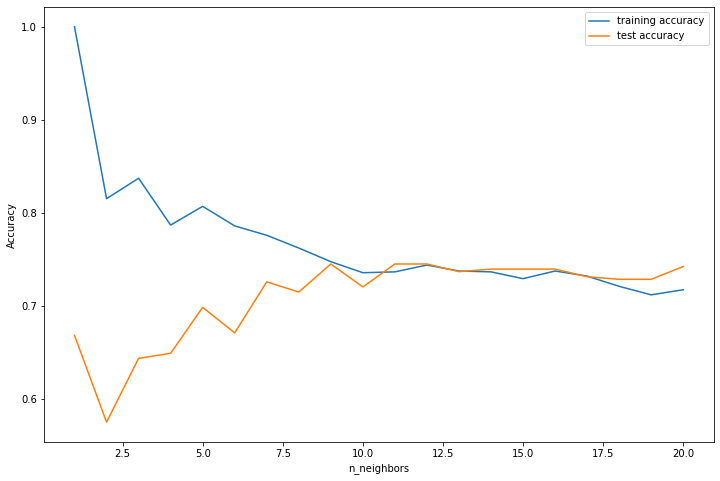

The optimal number of neighbors is: 9


In [259]:
# determining the optimal number of neighbors
opt_neighbors = optimal_neighbors(X_data= X_train, y_data=y_train,
                                 response_type='class')

In [260]:
# INSTANTIATING StandardScaler()
scaler = StandardScaler()


# FITTING the data
scaler.fit(chef_data)


# TRANSFORMING the data
X_scaled     = scaler.transform(chef_data)


# converting to a DataFrame
X_scaled_df  = pd.DataFrame(X_scaled) 


# train-test split with the scaled data
X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled = train_test_split(
            X_scaled_df,
            chef_target,
            random_state = 802,
            test_size = 0.25,
            stratify = chef_target)


# INSTANTIATING a KNN classification model with optimal neighbors
knn_opt = KNeighborsClassifier(n_neighbors =5)


# FITTING the training data
knn_fit = knn_opt.fit(X_train_scaled, y_train_scaled)


# PREDICTING based on the testing set
knn_pred = knn_fit.predict(X_test_scaled)


# SCORING the results
print('Training ACCURACY:', knn_opt.score(X_train_scaled, y_train_scaled).round(4))
print('Testing  ACCURACY:', knn_opt.score(X_test_scaled, y_test_scaled).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                          y_score = knn_pred).round(4))

Training ACCURACY: 0.8095
Testing  ACCURACY: 0.7002
AUC Score        : 0.6236


In the following we compare the confusion matrix for both knnclassification model and logisticregression model!

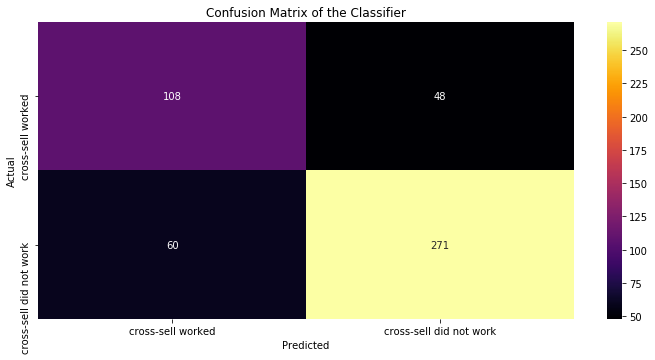

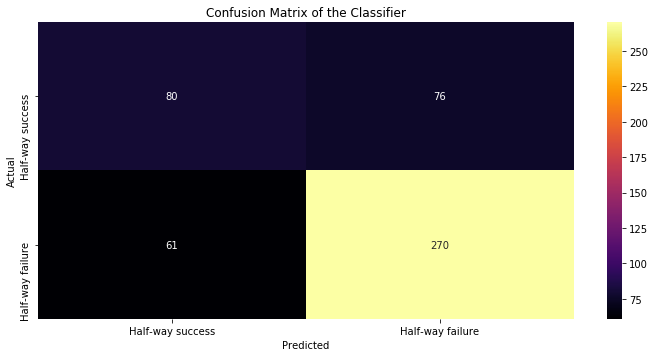

In [330]:
# calling the visual_cm function
fig, ax = plt.subplots(figsize = (12, 12))

plt.subplot(2, 1, 1)
visual_cm(true_y = y_test,
          pred_y = knn_pred,
          labels = ['cross-sell worked', 'cross-sell did not work'])
fig, ax = plt.subplots(figsize = (12, 12))
plt.subplot(2,1,2)
#put the logreg one here!
visual_cm(true_y = y_test,
          pred_y = logreg_pred,
          labels = ['Half-way success', 'Half-way failure'])
plt.show()

*An analysis of this confusion matrix could be:<br>
The confusion matrix as a metric to our model in logistic regression has the following response (and as plotted above):<br>
[[ 85  71]   True negative  /  False Positive   <br>
 [ 53 278]] False Negative  /  True positive    <br>
 meaning for instance:our false negative on the lower left is showing 53 meaning there has been a prediction of a failure of this promotion while the cross sell has been successful.<br>And we continue to interpret as it it. <br> here, in this case, I assume we really want the false negatives to implement the best strategy.<br>* As we proceed, we can plot the CM for every model, but we prefer to use __AUC__ as the main __Metric__ since it is better interpretable.
 


In [262]:
# train accuracy
knn_train_acc = knn_fit.score(X_train_scaled, y_train_scaled).round(4)


# test accuracy
knn_test_acc  = knn_fit.score(X_test_scaled, y_test_scaled).round(4)


# auc value
knn_auc       = roc_auc_score(y_true  = y_test_scaled,
                              y_score = knn_pred).round(4)


# saving the results
model_performance.append(['KNN Classification',
                          knn_train_acc,
                          knn_test_acc,
                          knn_auc])


# checking the results
for model in model_performance:
    print(model)

['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.743, 0.7454, 0.6924]
['KNN Classification', 0.8095, 0.7002, 0.6236]


__Classification tree -full- (Decision tree) logit_full__

In [263]:
# INSTANTIATING a classification tree object
full_tree = DecisionTreeClassifier()


# FITTING the training data
full_tree_fit = full_tree.fit(X_train, y_train)


# PREDICTING on new data
full_tree_pred = full_tree_fit.predict(X_test)


# SCORING the model
print('Training ACCURACY:', full_tree_fit.score(X_train, y_train).round(4))
print('Testing  ACCURACY:', full_tree_fit.score(X_test, y_test).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                          y_score = full_tree_pred).round(4))

Training ACCURACY: 1.0
Testing  ACCURACY: 0.7331
AUC Score        : 0.702


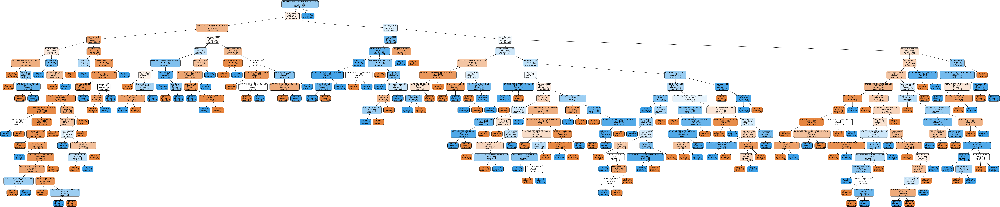

In [221]:
# calling display_tree
display_tree(tree       = full_tree_fit,
             feature_df = X_train)

In [264]:
#adding the result to model performance result
# train accuracy
full_tree_train_acc = full_tree_fit.score(X_train, y_train).round(4)


# test accuracy
full_tree_test_acc  = full_tree_fit.score(X_test, y_test).round(4)


# auc value
full_tree_auc       = roc_auc_score(y_true  = y_test,
                                    y_score = full_tree_pred).round(4)


# saving the results
model_performance.append(['Full Tree',
                          full_tree_train_acc,
                          full_tree_test_acc,
                          full_tree_auc])


# checking the results
for model in model_performance:
    print(model)

['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.743, 0.7454, 0.6924]
['KNN Classification', 0.8095, 0.7002, 0.6236]
['Full Tree', 1.0, 0.7331, 0.702]


__Pruned Decision Tree, logit_full__

Training ACCURACY: 0.8129
Testing  ACCURACY: 0.7639
AUC Score        : 0.7433


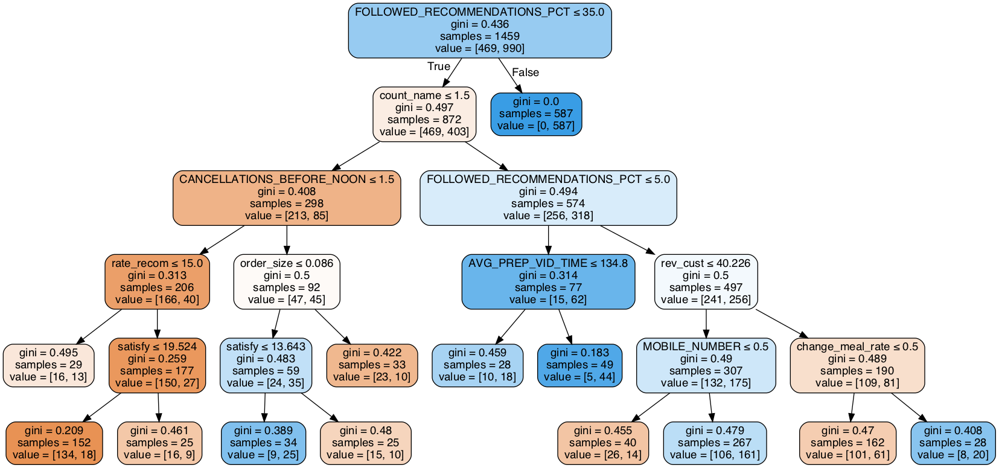

In [265]:
# INSTANTIATING a classification tree object
tree_pruned = DecisionTreeClassifier(max_depth=5,
                    min_samples_leaf= 25,
                    random_state = 802)


# FITTING the training data
tree_pruned_fit = tree_pruned.fit(X_train, y_train)


# PREDICTING on new data
tree_pred = tree_pruned_fit.predict(X_test)


# SCORING the model
print('Training ACCURACY:', tree_pruned_fit.score(X_train, y_train).round(4))
print('Testing  ACCURACY:', tree_pruned_fit.score(X_test, y_test).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                          y_score = tree_pred).round(4))


# calling display_tree
display_tree(tree       = tree_pruned_fit,
             feature_df = X_train)

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:194: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead


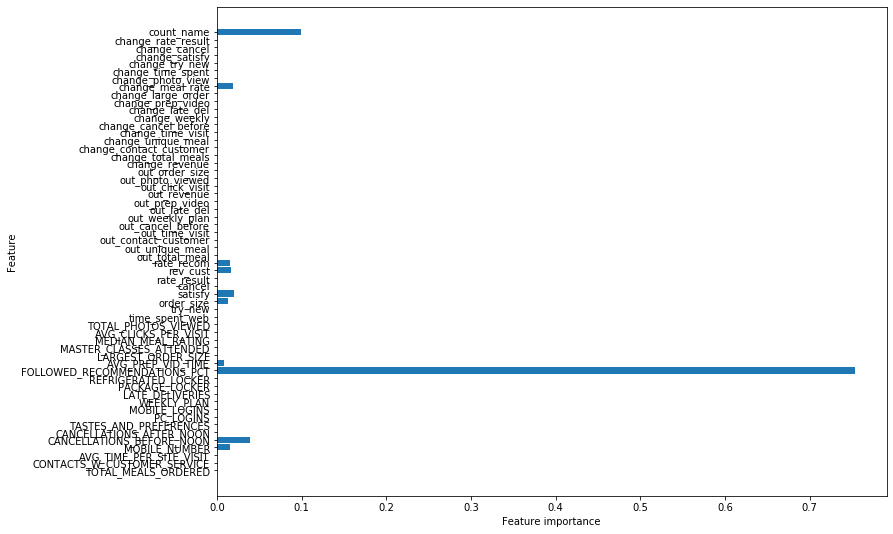

In [224]:
# plotting feature importance
plot_feature_importances(tree_pruned_fit,
                         train = X_train,
                         export = False)

***This importance visual means a lot and is to a level consistent with logistic regression:<br> It is showing how important the website meal recommendation is important and it gives a lot of insight that I will elaborate in insight write-up.<br> also, count name is playing a role here, names could be important in our case!***

In [266]:
#adding to our models portfolio
# train accuracy
p_tree_train_acc = tree_pruned_fit.score(X_train, y_train).round(4)


# test accuracy
p_tree_test_acc  = tree_pruned_fit.score(X_test, y_test).round(4)


# auc value
p_tree_auc       = roc_auc_score(y_true  = y_test,
                                 y_score = tree_pred).round(4)


# saving the results
model_performance.append(['Pruned Tree',
                          p_tree_train_acc,
                          p_tree_test_acc,
                          p_tree_auc])

for model in model_performance:
    print(model)


['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.743, 0.7454, 0.6924]
['KNN Classification', 0.8095, 0.7002, 0.6236]
['Full Tree', 1.0, 0.7331, 0.702]
['Pruned Tree', 0.8129, 0.7639, 0.7433]


__Random Forest Classifier model-logit_full__

In [267]:
# INSTANTIATING a random forest model with default values
rf_default = RandomForestClassifier(n_estimators     = 10,
                                    criterion        = 'gini',
                                    max_depth        = None,
                                    min_samples_leaf = 1,
                                    bootstrap        = True,
                                    warm_start       = False,
                                    random_state     = 802)
# FITTING the training data
rf_default_fit = rf_default.fit(X_train, y_train)


# PREDICTING based on the testing set
rf_default_fit_pred = rf_default_fit.predict(X_test)


# SCORING the results
print('Training ACCURACY:', rf_default_fit.score(X_train, y_train).round(4))
print('Testing  ACCURACY:', rf_default_fit.score(X_test, y_test).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                          y_score = rf_default_fit_pred).round(4))

Training ACCURACY: 0.9883
Testing  ACCURACY: 0.7618
AUC Score        : 0.7587


/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:194: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead


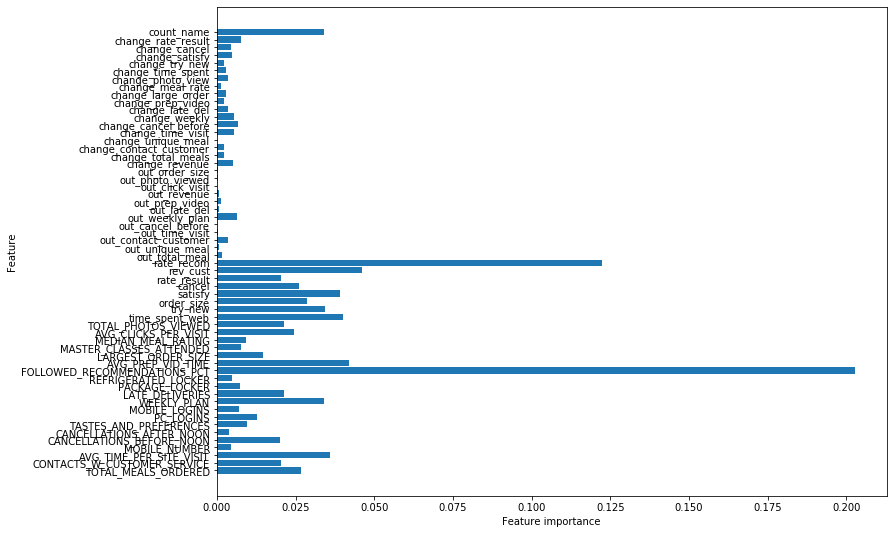

In [193]:
plot_feature_importances(rf_default_fit,
                         train = X_train,
                         export = False)

***Random forest has given a different result (comparing to decision tree) for how important each variable could be. Now, we see the ratings as a result of our recommendation on the web or mobile, could be important too to see how cross sell is successful or not*** 

In [268]:
# declaring model performance objects
rf_train_acc = rf_default_fit.score(X_train, y_train).round(4)
rf_test_acc  = rf_default_fit.score(X_test, y_test).round(4)
rf_auc       = roc_auc_score(y_true  = y_test,
                             y_score = rf_default_fit_pred).round(4)


# appending to model_performance
model_performance.append(['Random Forest',
                           rf_train_acc,
                           rf_test_acc,
                           rf_auc])
                          
                         


# checking the results
for model in model_performance:
    print(model)


['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.743, 0.7454, 0.6924]
['KNN Classification', 0.8095, 0.7002, 0.6236]
['Full Tree', 1.0, 0.7331, 0.702]
['Pruned Tree', 0.8129, 0.7639, 0.7433]
['Random Forest', 0.9883, 0.7618, 0.7587]


__GradientBoostingClassifier for logit_full__

In [270]:
# INSTANTIATING the model object without hyperparameters
full_gbm_default = GradientBoostingClassifier(loss          = 'deviance',
                                              learning_rate = 0.1,
                                              n_estimators  = 100,
                                              criterion     = 'friedman_mse',
                                              max_depth     = 3,
                                              warm_start    = False,
                                              random_state  = 802)


# FIT step is needed as we are not using .best_estimator
full_gbm_default_fit = full_gbm_default.fit(X_train, y_train)


# PREDICTING based on the testing set
full_gbm_default_pred = full_gbm_default_fit.predict(X_test)


# SCORING the results
print('Training ACCURACY:', full_gbm_default_fit.score(X_train, y_train).round(4))
print('Testing ACCURACY :', full_gbm_default_fit.score(X_test, y_test).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                          y_score = full_gbm_default_pred).round(4))

Training ACCURACY: 0.9178
Testing ACCURACY : 0.7844
AUC Score        : 0.7601


In [271]:
# declaring model performance objects
gbm_train_acc = full_gbm_default_fit.score(X_train, y_train).round(4)
gbm_test_acc  = full_gbm_default_fit.score(X_test, y_test).round(4)
gbm_auc       = roc_auc_score(y_true  = y_test,
                              y_score = full_gbm_default_pred).round(4)


# appending to model_performance
model_performance.append(['GBM',gbm_train_acc,gbm_test_acc,gbm_auc])
                                                    
                                                    
                       

                                       

# checking the results
for model in model_performance:
    print(model)


['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.743, 0.7454, 0.6924]
['KNN Classification', 0.8095, 0.7002, 0.6236]
['Full Tree', 1.0, 0.7331, 0.702]
['Pruned Tree', 0.8129, 0.7639, 0.7433]
['Random Forest', 0.9883, 0.7618, 0.7587]
['GBM', 0.9178, 0.7844, 0.7601]


__hyper parameter tuning and GridsearchCV for logistic_full__

Now, it is important to try all the models as we optimize them as well through Gridsearchcv.<br> The followings are all the models running again but with different scores, maybe higher and maybe lower

In [272]:
# INSTANTIATING a logistic regression model with default values
lr_default = LogisticRegression(solver = 'lbfgs',
                                C = 1.0,
                                warm_start = False,
                                random_state = 802)
# FITTING the training data
lr_default_fit = lr_default.fit(X_train, y_train)


# PREDICTING based on the testing set
lr_default_pred = lr_default_fit.predict(X_test)


# SCORING the results
print('Training ACCURACY:', lr_default_fit.score(X_train, y_train).round(4))
print('Testing  ACCURACY:', lr_default_fit.score(X_test, y_test).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                          y_score = lr_default_pred).round(4))

Training ACCURACY: 0.743
Testing  ACCURACY: 0.7454
AUC Score        : 0.6924


/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [273]:
########################################
# GridSearchCV for LogisticRegression
########################################

# declaring a hyperparameter space (give gridsearch some values to loop over)
C_space          = pd.np.arange(0.1, 3.0, 0.1)
warm_start_space = [True, False]


# creating a hyperparameter grid
param_grid = {'C'          : C_space,         #inputting c values to loop over
              'warm_start' : warm_start_space} #same for warm start


# INSTANTIATING the model object without hyperparameters
lr_tuned = LogisticRegression(solver = 'lbfgs',
                              max_iter=1000, #more iteration to to avoid the warning!
                              random_state = 802)


# GridSearchCV object
lr_tuned_cv = GridSearchCV(estimator  = lr_tuned, #which model to choose(i.e. estimator)
                           param_grid = param_grid, # where are the values for hyperparameters?
                           cv         = 3, # how many tests gridsearch should do?
                           scoring    = make_scorer(roc_auc_score,
                                                    needs_threshold = False)) #objective metric


# FITTING to the FULL DATASET (due to cross-validation)
lr_tuned_cv.fit(chef_data, chef_target)


# PREDICT step is not needed


# printing the optimal parameters and best score
print("Tuned Parameters  :", lr_tuned_cv.best_params_)
print("Tuned CV AUC      :", lr_tuned_cv.best_score_.round(4))

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number 

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stabl

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stabl

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stabl

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stabl

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stabl

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stabl

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stabl

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stabl

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stabl

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stabl

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stabl

Tuned Parameters  : {'C': 1.8000000000000003, 'warm_start': True}
Tuned CV AUC      : 0.6116


/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [ ]:
# it goes over (loops over) the X variables and tests, tests each combination, and sees which one
#was better or not. 
#when we apply a penalty(C) we want to standardize!

In [274]:
# building a model based on hyperparameter tuning results

# INSTANTIATING a logistic regression model with tuned values
lr_tuned = lr_tuned_cv.best_estimator_ #if run alone, shows what parameters are behind our optimization


# FIT step is not needed


# PREDICTING based on the testing set
lr_tuned_pred = lr_tuned.predict(X_test)


# SCORING the results
print('Training ACCURACY:', lr_tuned.score(X_train, y_train).round(4))
print('Testing  ACCURACY:', lr_tuned.score(X_test, y_test).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                  y_score = lr_tuned_pred).round(4))

Training ACCURACY: 0.7457
Testing  ACCURACY: 0.7577
AUC Score        : 0.7116


In [275]:
# declaring model performance objects
lr_train_acc = lr_tuned.score(X_train, y_train).round(4)
lr_test_acc  = lr_tuned.score(X_test, y_test).round(4)
lr_auc       = roc_auc_score(y_true  = y_test,
                             y_score = lr_tuned_pred).round(4)


# appending to model_performance
model_performance.append(['Tuned LR', lr_train_acc,  lr_test_acc,lr_auc])
                        
                          
                         
                    

# checking the results
for model in model_performance:
    print(model)


['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.743, 0.7454, 0.6924]
['KNN Classification', 0.8095, 0.7002, 0.6236]
['Full Tree', 1.0, 0.7331, 0.702]
['Pruned Tree', 0.8129, 0.7639, 0.7433]
['Random Forest', 0.9883, 0.7618, 0.7587]
['GBM', 0.9178, 0.7844, 0.7601]
['Tuned LR', 0.7457, 0.7577, 0.7116]


**Hyper parameter tuning and GridsearchCV on decision tree-logit_full**

In [276]:
# declaring a hyperparameter space
criterion_space = ['gini', 'entropy']
splitter_space = ['best', 'random']
depth_space = pd.np.arange(1, 25)
leaf_space  = pd.np.arange(1, 100)


# creating a hyperparameter grid
param_grid = {'criterion'        : criterion_space,
              'splitter'         : splitter_space,
              'max_depth'        : depth_space,
              'min_samples_leaf' : leaf_space}


# INSTANTIATING the model object without hyperparameters
tuned_tree = DecisionTreeClassifier(random_state = 802)


# GridSearchCV object
tuned_tree_cv = GridSearchCV(estimator  = tuned_tree,
                             param_grid = param_grid,
                             cv         = 3,
                             scoring    = make_scorer(roc_auc_score,
                             needs_threshold = False))


# FITTING to the FULL DATASET (due to cross-validation)
tuned_tree_cv.fit(chef_data, chef_target)


# PREDICT step is not needed


# printing the optimal parameters and best score
print("Tuned Parameters  :", tuned_tree_cv.best_params_)
print("Tuned Training AUC:", tuned_tree_cv.best_score_.round(4))

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  after removing the cwd from sys.path.
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  """


Tuned Parameters  : {'criterion': 'entropy', 'max_depth': 8, 'min_samples_leaf': 3, 'splitter': 'random'}
Tuned Training AUC: 0.6577


In [277]:
# building a model based on hyperparameter tuning results

# INSTANTIATING a logistic regression model with tuned values
tree_tuned = tuned_tree_cv.best_estimator_


# FIT step is not needed


# PREDICTING based on the testing set
tree_tuned_pred = tree_tuned.predict(X_test)


# SCORING the results
print('Training ACCURACY:', tree_tuned.score(X_train, y_train).round(4))
print('Testing  ACCURACY:', tree_tuned.score(X_test, y_test).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                          y_score = tree_tuned_pred).round(4))

Training ACCURACY: 0.791
Testing  ACCURACY: 0.8131
AUC Score        : 0.8117


In [278]:
# declaring model performance objects
tree_train_acc = tree_tuned.score(X_train, y_train).round(4)
tree_test_acc  = tree_tuned.score(X_test, y_test).round(4)
tree_auc       = roc_auc_score(y_true  = y_test,
                              y_score = tree_tuned_pred).round(4)


# appending to model_performance
model_performance.append(['Tuned Tree',tree_train_acc,tree_test_acc,tree_auc])
                          
                          

# checking the results
for model in model_performance:
    print(model)

['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.743, 0.7454, 0.6924]
['KNN Classification', 0.8095, 0.7002, 0.6236]
['Full Tree', 1.0, 0.7331, 0.702]
['Pruned Tree', 0.8129, 0.7639, 0.7433]
['Random Forest', 0.9883, 0.7618, 0.7587]
['GBM', 0.9178, 0.7844, 0.7601]
['Tuned LR', 0.7457, 0.7577, 0.7116]
['Tuned Tree', 0.791, 0.8131, 0.8117]


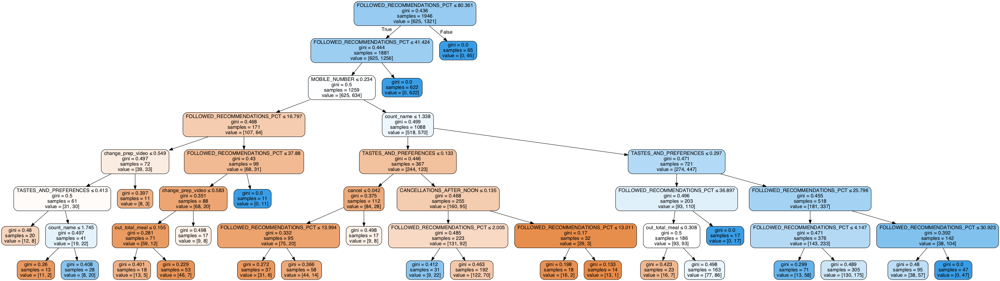

In [368]:
# displaying the tree after tuning
display_tree(tree = tree_tuned,
             feature_df = chef_data,
             height = 2000,
             width  = 2000)

In [ ]:
####Hyper parameter for Random forest

In [279]:
# declaring a hyperparameter space
estimator_space  = pd.np.arange(100, 1100, 250)
leaf_space       = pd.np.arange(1, 31, 10)
criterion_space  = ['gini', 'entropy']
bootstrap_space  = [True, False]
warm_start_space = [True, False]


# creating a hyperparameter grid
param_grid = {'n_estimators'     : estimator_space,
              'min_samples_leaf' : leaf_space,
              'criterion'        : criterion_space,
              'bootstrap'        : bootstrap_space,
              'warm_start'       : warm_start_space}


# INSTANTIATING the model object without hyperparameters
full_forest_grid = RandomForestClassifier(random_state = 802)


# GridSearchCV object
full_forest_cv = GridSearchCV(estimator  = full_forest_grid,
                              param_grid = param_grid,
                              cv         = 3,
                              scoring    = make_scorer(roc_auc_score,
                                           needs_threshold = False))


# FITTING to the FULL DATASET (due to cross-validation)
full_forest_cv.fit(chef_data, chef_target)




# printing the optimal parameters and best score
print("Tuned Parameters  :", full_forest_cv.best_params_)
print("Tuned Training AUC:", full_forest_cv.best_score_.round(4))

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  This is separate from the ipykernel package so we can avoid doing imports until


Tuned Parameters  : {'bootstrap': False, 'criterion': 'gini', 'min_samples_leaf': 1, 'n_estimators': 100, 'warm_start': True}
Tuned Training AUC: 0.6237


In [280]:
# INSTANTIATING the model object without hyperparameters
full_rf_tuned = RandomForestClassifier(bootstrap        = True,
                                       criterion        = 'gini',
                                       min_samples_leaf = 11,
                                       n_estimators     = 850,
                                       warm_start       = True,
                                       random_state     = 802)


# FIT step is needed as we are not using .best_estimator
full_rf_tuned_fit = full_rf_tuned.fit(X_train, y_train)


# PREDICTING based on the testing set
full_rf_tuned_pred = full_rf_tuned_fit.predict(X_test)


# SCORING the results
print('Training ACCURACY:', full_rf_tuned_fit.score(X_train, y_train).round(4))
print('Testing  ACCURACY:', full_rf_tuned_fit.score(X_test, y_test).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                          y_score = full_rf_tuned_pred).round(4))

Training ACCURACY: 0.8883
Testing  ACCURACY: 0.7639
AUC Score        : 0.7195


In [281]:
rf_train_acc = full_rf_tuned_fit.score(X_train, y_train).round(4)
rf_test_acc  = full_rf_tuned_fit.score(X_test, y_test).round(4)
rf_auc       = roc_auc_score(y_true  = y_test,
                             y_score = full_rf_tuned_pred).round(4)
# appending to model_performance
model_performance.append(['Rf_tuned',
                           rf_train_acc,
                           rf_test_acc,
                           rf_auc])
                          
                         


# checking the results
for model in model_performance:
    print(model)


['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.743, 0.7454, 0.6924]
['KNN Classification', 0.8095, 0.7002, 0.6236]
['Full Tree', 1.0, 0.7331, 0.702]
['Pruned Tree', 0.8129, 0.7639, 0.7433]
['Random Forest', 0.9883, 0.7618, 0.7587]
['GBM', 0.9178, 0.7844, 0.7601]
['Tuned LR', 0.7457, 0.7577, 0.7116]
['Tuned Tree', 0.791, 0.8131, 0.8117]
['Rf_tuned', 0.8883, 0.7639, 0.7195]


In [282]:
# declaring a hyperparameter space for GradientBoosting
learn_space     = pd.np.arange(0.1, 1.6, 0.3)
estimator_space = pd.np.arange(50, 250, 50)
depth_space     = pd.np.arange(1, 10)


# creating a hyperparameter grid
param_grid = {'learning_rate' : learn_space,
              'max_depth'     : depth_space,
              'n_estimators'  : estimator_space}


# INSTANTIATING the model object without hyperparameters
full_gbm_grid = GradientBoostingClassifier(random_state = 802)


# GridSearchCV object
full_gbm_cv = GridSearchCV(estimator  = full_gbm_grid,
                           param_grid = param_grid,
                           cv         = 3,
                           scoring    = make_scorer(roc_auc_score,
                                        needs_threshold = False))


# FITTING to the FULL DATASET (due to cross-validation)
full_gbm_cv.fit(chef_data, chef_target)


# PREDICT step is not needed


# printing the optimal parameters and best score
print("Tuned Parameters  :", full_gbm_cv.best_params_)
print("Tuned Training AUC:", full_gbm_cv.best_score_.round(4))

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  after removing the cwd from sys.path.


Tuned Parameters  : {'learning_rate': 1.3000000000000003, 'max_depth': 1, 'n_estimators': 50}
Tuned Training AUC: 0.6414


In [283]:
# INSTANTIATING the model object without hyperparameters
gbm_tuned = GradientBoostingClassifier(learning_rate = 0.1,
                                       max_depth     = 2,
                                       n_estimators  = 100,
                                       random_state  = 802)


# FIT step is needed as we are not using .best_estimator
gbm_tuned_fit = gbm_tuned.fit(X_train, y_train)


# PREDICTING based on the testing set
gbm_tuned_pred = gbm_tuned_fit.predict(X_test)


# SCORING the results
print('Training ACCURACY:', gbm_tuned_fit.score(X_train, y_train).round(4))
print('Testing  ACCURACY:', gbm_tuned_fit.score(X_test, y_test).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                          y_score = gbm_tuned_pred).round(4))

Training ACCURACY: 0.8581
Testing  ACCURACY: 0.7864
AUC Score        : 0.7616


In [284]:
# declaring model performance objects
gbm_train_acc = gbm_tuned_fit.score(X_train, y_train).round(4)
gbm_test_acc  = gbm_tuned_fit.score(X_test, y_test).round(4)
gbm_auc       = roc_auc_score(y_true  = y_test,
                              y_score = gbm_tuned_pred).round(4)


# appending to model_performance
model_performance.append(['Tuned GBM',gbm_train_acc,gbm_test_acc,gbm_auc])
                          


# checking the results
for model in model_performance:
    print(model)

['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.743, 0.7454, 0.6924]
['KNN Classification', 0.8095, 0.7002, 0.6236]
['Full Tree', 1.0, 0.7331, 0.702]
['Pruned Tree', 0.8129, 0.7639, 0.7433]
['Random Forest', 0.9883, 0.7618, 0.7587]
['GBM', 0.9178, 0.7844, 0.7601]
['Tuned LR', 0.7457, 0.7577, 0.7116]
['Tuned Tree', 0.791, 0.8131, 0.8117]
['Rf_tuned', 0.8883, 0.7639, 0.7195]
['Tuned GBM', 0.8581, 0.7864, 0.7616]


In [290]:
# declaring a DataFrame object
model_performance_df = pd.DataFrame(model_performance[1:], columns = model_performance[0])


# saving the DataFrame to Excel
model_performance_df.to_excel('Apprentice_Classification_Model_Performance_full.xlsx',
                              index = False)
model_performance_df  

,Model,Training Accuracy,Testing Accuracy,AUC Value
0,Logistic Regression,0.7430,0.7454,0.6924
1,KNN Classification,0.8095,0.7002,0.6236
2,Full Tree,1.0000,0.7331,0.7020
3,Pruned Tree,0.8129,0.7639,0.7433
4,Random Forest,0.9883,0.7618,0.7587
5,GBM,0.9178,0.7844,0.7601
6,Tuned LR,0.7457,0.7577,0.7116
7,Tuned Tree,0.7910,0.8131,0.8117
8,Rf_tuned,0.8883,0.7639,0.7195
9,Tuned GBM,0.8581,0.7864,0.7616


In [291]:
model_performance_df.sort_values(by = 'AUC Value',
                              ascending = False)

,Model,Training Accuracy,Testing Accuracy,AUC Value
7,Tuned Tree,0.7910,0.8131,0.8117
9,Tuned GBM,0.8581,0.7864,0.7616
5,GBM,0.9178,0.7844,0.7601
4,Random Forest,0.9883,0.7618,0.7587
3,Pruned Tree,0.8129,0.7639,0.7433
8,Rf_tuned,0.8883,0.7639,0.7195
6,Tuned LR,0.7457,0.7577,0.7116
2,Full Tree,1.0000,0.7331,0.7020
0,Logistic Regression,0.7430,0.7454,0.6924
1,KNN Classification,0.8095,0.7002,0.6236


# All the models and optimizations significant variables (logit_sig)

***Please note that all the names are the same with logit_full, so before trying any model for either of full or sig, make sure to run the train and test split for the desired set of variables.<br> Only, the final result is collected in different model performance files as a matter of comparison***

__Logistic Regression for logit_sig__

In [292]:
# train/test split with the significant variables 
chef_data   =  chef.loc[ : , option_dict['logit_sig']]
chef_target =  chef.loc[ : , 'CROSS_SELL_SUCCESS']


# This is the exact code we were using before
X_train, X_test, y_train, y_test = train_test_split(
            chef_data,
            chef_target,
            test_size    = 0.25,
            random_state = 802,
            stratify     = chef_target)


# INSTANTIATING a logistic regression model
logreg = LogisticRegression(solver = 'lbfgs',
                            C = 1,
                            random_state = 802)


# FITTING the training data
logreg_fit = logreg.fit(X_train, y_train)


# PREDICTING based on the testing set
logreg_pred = logreg_fit.predict(X_test)


# SCORING the results
print('Training ACCURACY:', logreg_fit.score(X_train, y_train).round(4))
print('Testing  ACCURACY:', logreg_fit.score(X_test, y_test).round(4))


Training ACCURACY: 0.6964
Testing  ACCURACY: 0.7187


/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [293]:
#conducting the confusion matrix
print(confusion_matrix(y_true = y_test,
                       y_pred = logreg_pred))

[[ 80  76]
 [ 61 270]]


In [295]:
# area under the roc curve (auc)
roc_auc_score(y_true  = y_test,
              y_score = logreg_pred)

0.6642652413045163

Comparing to the logit_full and in general this is not a very high AUC and this shows this metric for this model is giving us a poor result

In [296]:
# creating model performance for each model
model_performance_sig = [['Model', 'Training Accuracy',
                      'Testing Accuracy', 'AUC Value']]


# train accuracy
logreg_train_acc  = logreg_fit.score(X_train, y_train).round(4)


# test accuracy
logreg_test_acc   = logreg_fit.score(X_test, y_test).round(4)


# auc value
logreg_auc = roc_auc_score(y_true  = y_test,
                           y_score = logreg_pred).round(4)


# saving the results
model_performance_sig.append(['Logistic Regression',
                          logreg_train_acc,
                          logreg_test_acc,
                          logreg_auc])


# checking the results
for model in model_performance_sig:
    print(model)

['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.6964, 0.7187, 0.6643]


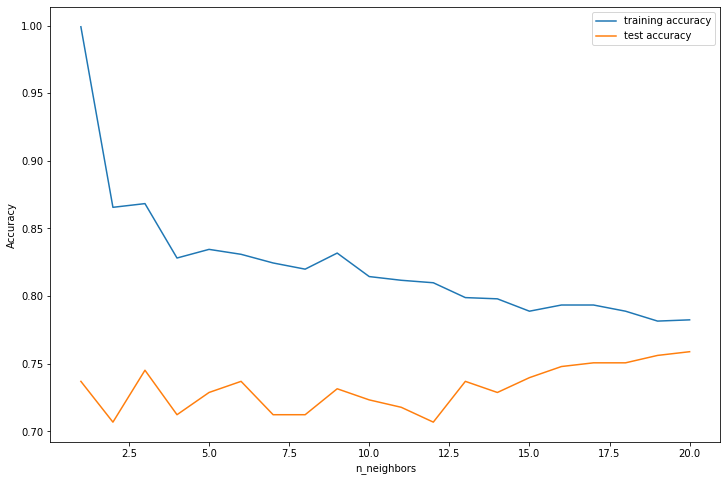

The optimal number of neighbors is: 20


In [297]:
# determining the optimal number of neighbors
opt_neighbors = optimal_neighbors(X_data= X_train, y_data=y_train,
                                 response_type='class')

__KNN Classification model for logit_sig__

In [298]:
# INSTANTIATING StandardScaler()
scaler = StandardScaler()


# FITTING the data
scaler.fit(chef_data)


# TRANSFORMING the data
X_scaled     = scaler.transform(chef_data)


# converting to a DataFrame
X_scaled_df  = pd.DataFrame(X_scaled) 


# train-test split with the scaled data
X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled = train_test_split(
            X_scaled_df,
            chef_target,
            random_state = 802,
            test_size = 0.25,
            stratify = chef_target)


# INSTANTIATING a KNN classification model with optimal neighbors
knn_opt = KNeighborsClassifier(n_neighbors =5)


# FITTING the training data
knn_fit = knn_opt.fit(X_train_scaled, y_train_scaled)


# PREDICTING based on the testing set
knn_pred = knn_fit.predict(X_test_scaled)


# SCORING the results
print('Training ACCURACY:', knn_opt.score(X_train_scaled, y_train_scaled).round(4))
print('Testing  ACCURACY:', knn_opt.score(X_test_scaled, y_test_scaled).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                          y_score = knn_pred).round(4))

Training ACCURACY: 0.8355
Testing  ACCURACY: 0.7782
AUC Score        : 0.7555


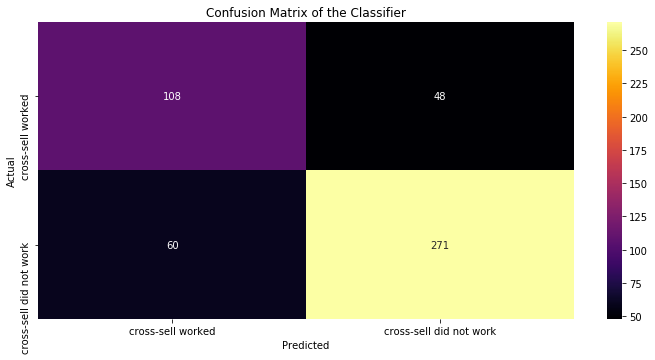

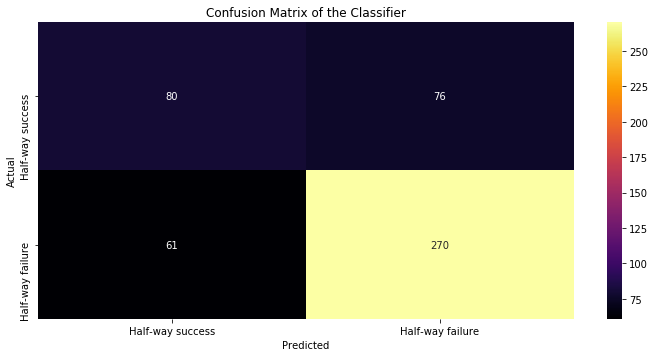

In [331]:
# calling the visual_cm function and compare CM for KNN and LR
fig, ax = plt.subplots(figsize = (12, 12))

plt.subplot(2, 1, 1)
visual_cm(true_y = y_test,
          pred_y = knn_pred,
          labels = ['cross-sell worked', 'cross-sell did not work'])
fig, ax = plt.subplots(figsize = (12, 12))
plt.subplot(2,1,2)
#put the logreg one here!
visual_cm(true_y = y_test,
          pred_y = logreg_pred,
          labels = ['Half-way success', 'Half-way failure'])
plt.show()

In [300]:
# train accuracy
knn_train_acc = knn_fit.score(X_train_scaled, y_train_scaled).round(4)


# test accuracy
knn_test_acc  = knn_fit.score(X_test_scaled, y_test_scaled).round(4)


# auc value
knn_auc       = roc_auc_score(y_true  = y_test_scaled,
                              y_score = knn_pred).round(4)


# saving the results
model_performance_sig.append(['KNN Classification',
                          knn_train_acc,
                          knn_test_acc,
                          knn_auc])


# checking the results
for model in model_performance_sig:
    print(model)

['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.6964, 0.7187, 0.6643]
['KNN Classification', 0.8355, 0.7782, 0.7555]


__Decision Tree for logit_sig  (Full tree)__

In [301]:
# INSTANTIATING a classification tree object
full_tree = DecisionTreeClassifier()


# FITTING the training data
full_tree_fit = full_tree.fit(X_train, y_train)


# PREDICTING on new data
full_tree_pred = full_tree_fit.predict(X_test)


# SCORING the model
print('Training ACCURACY:', full_tree_fit.score(X_train, y_train).round(4))
print('Testing  ACCURACY:', full_tree_fit.score(X_test, y_test).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                          y_score = full_tree_pred).round(4))

Training ACCURACY: 0.9986
Testing  ACCURACY: 0.7413
AUC Score        : 0.708


In [302]:
# calling display_tree
display_tree(tree       = full_tree_fit,
             feature_df = X_train)

In [303]:
# train accuracy
full_tree_train_acc = full_tree_fit.score(X_train, y_train).round(4)


# test accuracy
full_tree_test_acc  = full_tree_fit.score(X_test, y_test).round(4)


# auc value
full_tree_auc       = roc_auc_score(y_true  = y_test,
                                    y_score = full_tree_pred).round(4)


# saving the results
model_performance_sig.append(['Full Tree',
                          full_tree_train_acc,
                          full_tree_test_acc,
                          full_tree_auc])


# checking the results
for model in model_performance_sig:
    print(model)

['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.6964, 0.7187, 0.6643]
['KNN Classification', 0.8355, 0.7782, 0.7555]
['Full Tree', 0.9986, 0.7413, 0.708]


__Decision Tree for logit_sig (Pruned tree)__

Training ACCURACY: 0.7958
Testing  ACCURACY: 0.7947
AUC Score        : 0.7456


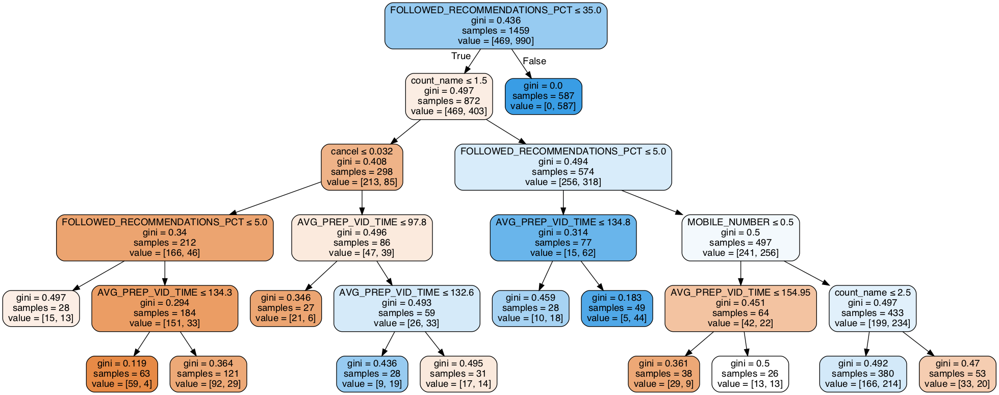

In [304]:
# INSTANTIATING a classification tree object
tree_pruned = DecisionTreeClassifier(max_depth=5,
                    min_samples_leaf= 25,
                    random_state = 802)


# FITTING the training data
tree_pruned_fit = tree_pruned.fit(X_train, y_train)


# PREDICTING on new data
tree_pred = tree_pruned_fit.predict(X_test)


# SCORING the model
print('Training ACCURACY:', tree_pruned_fit.score(X_train, y_train).round(4))
print('Testing  ACCURACY:', tree_pruned_fit.score(X_test, y_test).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                          y_score = tree_pred).round(4))


# calling display_tree
display_tree(tree       = tree_pruned_fit,
             feature_df = X_train)

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:194: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead


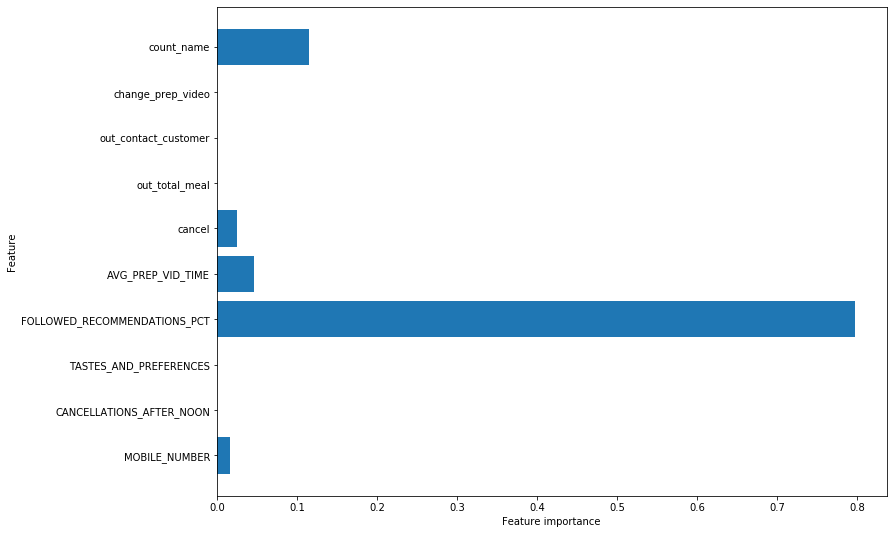

In [305]:
# plotting feature importance
plot_feature_importances(tree_pruned_fit,
                         train = X_train,
                         export = False)

In [306]:
#adding the result to the model performance list
# train accuracy
p_tree_train_acc = tree_pruned_fit.score(X_train, y_train).round(4)


# test accuracy
p_tree_test_acc  = tree_pruned_fit.score(X_test, y_test).round(4)


# auc value
p_tree_auc       = roc_auc_score(y_true  = y_test,
                                 y_score = tree_pred).round(4)


# saving the results
model_performance_sig.append(['Pruned Tree',
                          p_tree_train_acc,
                          p_tree_test_acc,
                          p_tree_auc])

for model in model_performance_sig:
    print(model)

['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.6964, 0.7187, 0.6643]
['KNN Classification', 0.8355, 0.7782, 0.7555]
['Full Tree', 0.9986, 0.7413, 0.708]
['Pruned Tree', 0.7958, 0.7947, 0.7456]


__Random Forest Classifier for logit_sig__

In [307]:
# INSTANTIATING a random forest model with default values
rf_default = RandomForestClassifier(n_estimators     = 10,
                                    criterion        = 'gini',
                                    max_depth        = None,
                                    min_samples_leaf = 1,
                                    bootstrap        = True,
                                    warm_start       = False,
                                    random_state     = 802)
# FITTING the training data
rf_default_fit = rf_default.fit(X_train, y_train)


# PREDICTING based on the testing set
rf_default_fit_pred = rf_default_fit.predict(X_test)


# SCORING the results
print('Training ACCURACY:', rf_default_fit.score(X_train, y_train).round(4))
print('Testing  ACCURACY:', rf_default_fit.score(X_test, y_test).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                          y_score = rf_default_fit_pred).round(4))

Training ACCURACY: 0.9863
Testing  ACCURACY: 0.77
AUC Score        : 0.7613


/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:194: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead


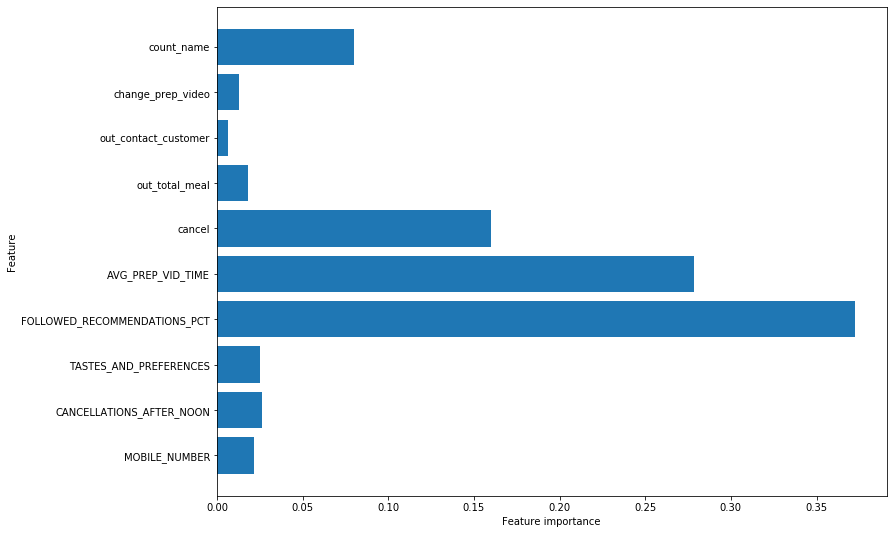

In [308]:
plot_feature_importances(rf_default_fit,
                         train = X_train,
                         export = False)

In [309]:
# declaring model performance objects
rf_train_acc = rf_default_fit.score(X_train, y_train).round(4)
rf_test_acc  = rf_default_fit.score(X_test, y_test).round(4)
rf_auc       = roc_auc_score(y_true  = y_test,
                             y_score = rf_default_fit_pred).round(4)


# appending to model_performance
model_performance_sig.append(['Random Forest',
                           rf_train_acc,
                           rf_test_acc,
                           rf_auc])
                          
                         


# checking the results
for model in model_performance_sig:
    print(model)

['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.6964, 0.7187, 0.6643]
['KNN Classification', 0.8355, 0.7782, 0.7555]
['Full Tree', 0.9986, 0.7413, 0.708]
['Pruned Tree', 0.7958, 0.7947, 0.7456]
['Random Forest', 0.9863, 0.77, 0.7613]


__Gradient Boosting Classifier for logit_sig__

In [310]:
# INSTANTIATING 
full_gbm_default = GradientBoostingClassifier(loss          = 'deviance',
                                              learning_rate = 0.1,
                                              n_estimators  = 100,
                                              criterion     = 'friedman_mse',
                                              max_depth     = 3,
                                              warm_start    = False,
                                              random_state  = 802)


# FIT step is needed as we are not using .best_estimator
full_gbm_default_fit = full_gbm_default.fit(X_train, y_train)


# PREDICTING based on the testing set
full_gbm_default_pred = full_gbm_default_fit.predict(X_test)


# SCORING the results
print('Training ACCURACY:', full_gbm_default_fit.score(X_train, y_train).round(4))
print('Testing ACCURACY :', full_gbm_default_fit.score(X_test, y_test).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                          y_score = full_gbm_default_pred).round(4))

Training ACCURACY: 0.8615
Testing ACCURACY : 0.7844
AUC Score        : 0.7685


In [311]:
# declaring model performance objects
gbm_train_acc = full_gbm_default_fit.score(X_train, y_train).round(4)
gbm_test_acc  = full_gbm_default_fit.score(X_test, y_test).round(4)
gbm_auc       = roc_auc_score(y_true  = y_test,
                              y_score = full_gbm_default_pred).round(4)


# appending to model_performance
model_performance_sig.append(['GBM',gbm_train_acc,gbm_test_acc,gbm_auc])
                                                    
                                                    
                                       

# checking the results
for model in model_performance_sig:
    print(model)


['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.6964, 0.7187, 0.6643]
['KNN Classification', 0.8355, 0.7782, 0.7555]
['Full Tree', 0.9986, 0.7413, 0.708]
['Pruned Tree', 0.7958, 0.7947, 0.7456]
['Random Forest', 0.9863, 0.77, 0.7613]
['GBM', 0.8615, 0.7844, 0.7685]


__Conducting hyperparameter tuning for all the models__

In [312]:
# INSTANTIATING a logistic regression model with default values
lr_default = LogisticRegression(solver = 'lbfgs',
                                C = 1.0,
                                warm_start = False,
                                random_state = 802)
# FITTING the training data
lr_default_fit = lr_default.fit(X_train, y_train)


# PREDICTING based on the testing set
lr_default_pred = lr_default_fit.predict(X_test)


# SCORING the results
print('Training ACCURACY:', lr_default_fit.score(X_train, y_train).round(4))
print('Testing  ACCURACY:', lr_default_fit.score(X_test, y_test).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                          y_score = lr_default_pred).round(4))

Training ACCURACY: 0.6964
Testing  ACCURACY: 0.7187
AUC Score        : 0.6643


/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [313]:

# GridSearchCV for LogisticRegression
########################################

# declaring a hyperparameter space (give gridsearch some values to loop over)
C_space          = pd.np.arange(0.1, 3.0, 0.1)
warm_start_space = [True, False]


# creating a hyperparameter grid
param_grid = {'C'          : C_space,         #inputting c values to loop over
              'warm_start' : warm_start_space} #same for warm start


# INSTANTIATING the model object without hyperparameters
lr_tuned = LogisticRegression(solver = 'lbfgs',
                              max_iter=1000, #more iteration to to avoid the warning!
                              random_state = 802)


# GridSearchCV object
lr_tuned_cv = GridSearchCV(estimator  = lr_tuned, #which model to choose(i.e. estimator)
                           param_grid = param_grid, # where are the values for hyperparameters?
                           cv         = 3, # how many tests gridsearch should do?
                           scoring    = make_scorer(roc_auc_score,
                                                    needs_threshold = False)) #objective metric


# FITTING to the FULL DATASET (due to cross-validation)
lr_tuned_cv.fit(chef_data, chef_target)


# PREDICT step is not needed


# printing the optimal parameters and best score
print("Tuned Parameters  :", lr_tuned_cv.best_params_)
print("Tuned CV AUC      :", lr_tuned_cv.best_score_.round(4))

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  """


Tuned Parameters  : {'C': 2.9000000000000004, 'warm_start': True}
Tuned CV AUC      : 0.5894


In [314]:
# building a model based on hyperparameter tuning results

# INSTANTIATING a logistic regression model with tuned values
lr_tuned = lr_tuned_cv.best_estimator_ #if run alone, shows what parameters are behind our optimization


# FIT step is not needed


# PREDICTING based on the testing set
lr_tuned_pred = lr_tuned.predict(X_test)


# SCORING the results
print('Training ACCURACY:', lr_tuned.score(X_train, y_train).round(4))
print('Testing  ACCURACY:', lr_tuned.score(X_test, y_test).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                  y_score = lr_tuned_pred).round(4))

Training ACCURACY: 0.7094
Testing  ACCURACY: 0.7413
AUC Score        : 0.6927


In [315]:
# Building model performance objects
lr_train_acc = lr_tuned.score(X_train, y_train).round(4)
lr_test_acc  = lr_tuned.score(X_test, y_test).round(4)
lr_auc       = roc_auc_score(y_true  = y_test,
                             y_score = lr_tuned_pred).round(4)


# appending to model_performance
model_performance_sig.append(['Tuned LR', lr_train_acc,  lr_test_acc,lr_auc])
                        
                          
                         
                    

# checking the results
for model in model_performance_sig:
    print(model)


['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.6964, 0.7187, 0.6643]
['KNN Classification', 0.8355, 0.7782, 0.7555]
['Full Tree', 0.9986, 0.7413, 0.708]
['Pruned Tree', 0.7958, 0.7947, 0.7456]
['Random Forest', 0.9863, 0.77, 0.7613]
['GBM', 0.8615, 0.7844, 0.7685]
['Tuned LR', 0.7094, 0.7413, 0.6927]


In [316]:
#GridSearchCV for Decision trees
#####
# declaring a hyperparameter space
criterion_space = ['gini', 'entropy']
splitter_space = ['best', 'random']
depth_space = pd.np.arange(1, 25)
leaf_space  = pd.np.arange(1, 100)


# creating a hyperparameter grid
param_grid = {'criterion'        : criterion_space,
              'splitter'         : splitter_space,
              'max_depth'        : depth_space,
              'min_samples_leaf' : leaf_space}


# INSTANTIATING the model object without hyperparameters
tuned_tree = DecisionTreeClassifier(random_state = 802)


# GridSearchCV object
tuned_tree_cv = GridSearchCV(estimator  = tuned_tree,
                             param_grid = param_grid,
                             cv         = 3,
                             scoring    = make_scorer(roc_auc_score,
                             needs_threshold = False))


# FITTING to the FULL DATASET (due to cross-validation)
tuned_tree_cv.fit(chef_data, chef_target)


# PREDICT step is not needed


# printing the optimal parameters and best score
print("Tuned Parameters  :", tuned_tree_cv.best_params_)
print("Tuned Training AUC:", tuned_tree_cv.best_score_.round(4))

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  import sys


Tuned Parameters  : {'criterion': 'gini', 'max_depth': 7, 'min_samples_leaf': 10, 'splitter': 'random'}
Tuned Training AUC: 0.6557


In [317]:
# building a model based on hyperparameter tuning results

# INSTANTIATING a logistic regression model with tuned values
tree_tuned = tuned_tree_cv.best_estimator_


# FIT step is not needed


# PREDICTING based on the testing set
tree_tuned_pred = tree_tuned.predict(X_test)


# SCORING the results
print('Training ACCURACY:', tree_tuned.score(X_train, y_train).round(4))
print('Testing  ACCURACY:', tree_tuned.score(X_test, y_test).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                          y_score = tree_tuned_pred).round(4))

Training ACCURACY: 0.7827
Testing  ACCURACY: 0.7967
AUC Score        : 0.7403


In [318]:
#  model performance objects
tree_train_acc = tree_tuned.score(X_train, y_train).round(4)
tree_test_acc  = tree_tuned.score(X_test, y_test).round(4)
tree_auc       = roc_auc_score(y_true  = y_test,
                              y_score = tree_tuned_pred).round(4)


# appending to model_performance
model_performance_sig.append(['Tuned Tree',tree_train_acc,tree_test_acc,tree_auc])
                          
                          

# checking the results
for model in model_performance_sig:
    print(model)

['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.6964, 0.7187, 0.6643]
['KNN Classification', 0.8355, 0.7782, 0.7555]
['Full Tree', 0.9986, 0.7413, 0.708]
['Pruned Tree', 0.7958, 0.7947, 0.7456]
['Random Forest', 0.9863, 0.77, 0.7613]
['GBM', 0.8615, 0.7844, 0.7685]
['Tuned LR', 0.7094, 0.7413, 0.6927]
['Tuned Tree', 0.7827, 0.7967, 0.7403]


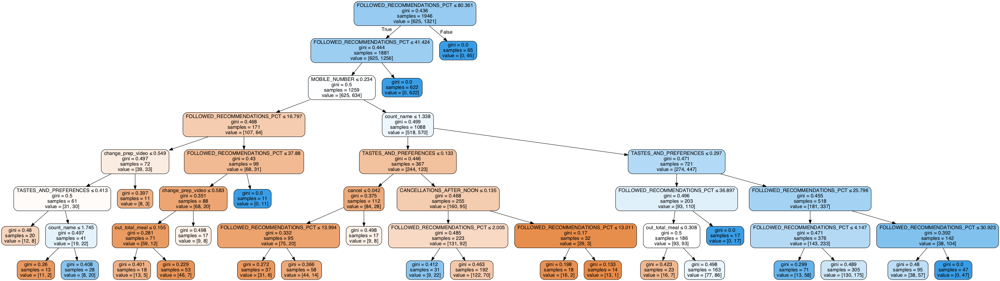

In [319]:
# displaying the tree after tuning
display_tree(tree = tree_tuned,
             feature_df = chef_data,
             height = 2000,
             width  = 2000)

In [320]:
####################
#GridSearchCV for Random forest
# declaring a hyperparameter space
estimator_space  = pd.np.arange(100, 1100, 250)
leaf_space       = pd.np.arange(1, 31, 10)
criterion_space  = ['gini', 'entropy']
bootstrap_space  = [True, False]
warm_start_space = [True, False]


# creating a hyperparameter grid
param_grid = {'n_estimators'     : estimator_space,
              'min_samples_leaf' : leaf_space,
              'criterion'        : criterion_space,
              'bootstrap'        : bootstrap_space,
              'warm_start'       : warm_start_space}


# INSTANTIATING the model object without hyperparameters
sig_forest_grid = RandomForestClassifier(random_state = 802)


# GridSearchCV object
sig_forest_cv = GridSearchCV(estimator  = sig_forest_grid,
                              param_grid = param_grid,
                              cv         = 3,
                              scoring    = make_scorer(roc_auc_score,
                                           needs_threshold = False))


# FITTING to the FULL DATASET (due to cross-validation)
sig_forest_cv.fit(chef_data, chef_target)




# printing the optimal parameters and best score
print("Tuned Parameters  :", sig_forest_cv.best_params_)
print("Tuned Training AUC:", sig_forest_cv.best_score_.round(4))

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  after removing the cwd from sys.path.
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  """


Tuned Parameters  : {'bootstrap': True, 'criterion': 'gini', 'min_samples_leaf': 1, 'n_estimators': 100, 'warm_start': True}
Tuned Training AUC: 0.6365


In [321]:
# INSTANTIATING the model object with hyperparameters
sig_rf_tuned = RandomForestClassifier(bootstrap        = True,
                                       criterion        = 'gini',
                                       min_samples_leaf = 11,
                                       n_estimators     = 850,
                                       warm_start       = True,
                                       random_state     = 802)


# FIT step is needed as we are not using .best_estimator
sig_rf_tuned_fit = sig_rf_tuned.fit(X_train, y_train)


# PREDICTING based on the testing set
sig_rf_tuned_pred = sig_rf_tuned_fit.predict(X_test)


# SCORING the results
print('Training ACCURACY:', sig_rf_tuned_fit.score(X_train, y_train).round(4))
print('Testing  ACCURACY:', sig_rf_tuned_fit.score(X_test, y_test).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                          y_score = sig_rf_tuned_pred).round(4))

Training ACCURACY: 0.841
Testing  ACCURACY: 0.7967
AUC Score        : 0.7708


In [322]:
rf_train_acc = sig_rf_tuned_fit.score(X_train, y_train).round(4)
rf_test_acc  = sig_rf_tuned_fit.score(X_test, y_test).round(4)
rf_auc       = roc_auc_score(y_true  = y_test,
                             y_score = sig_rf_tuned_pred).round(4)
# appending to model_performance
model_performance_sig.append(['Rf_tuned',
                           rf_train_acc,
                           rf_test_acc,
                           rf_auc])
                          
                         


# checking the results
for model in model_performance_sig:
    print(model)


['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.6964, 0.7187, 0.6643]
['KNN Classification', 0.8355, 0.7782, 0.7555]
['Full Tree', 0.9986, 0.7413, 0.708]
['Pruned Tree', 0.7958, 0.7947, 0.7456]
['Random Forest', 0.9863, 0.77, 0.7613]
['GBM', 0.8615, 0.7844, 0.7685]
['Tuned LR', 0.7094, 0.7413, 0.6927]
['Tuned Tree', 0.7827, 0.7967, 0.7403]
['Rf_tuned', 0.841, 0.7967, 0.7708]


In [323]:
#######
#GridSearchCV for GradientBoosting
# declaring a hyperparameter space for GradientBoosting
learn_space     = pd.np.arange(0.1, 1.6, 0.3)
estimator_space = pd.np.arange(50, 250, 50)
depth_space     = pd.np.arange(1, 10)


# creating a hyperparameter grid
param_grid = {'learning_rate' : learn_space,
              'max_depth'     : depth_space,
              'n_estimators'  : estimator_space}


# INSTANTIATING the model object without hyperparameters
sig_gbm_grid = GradientBoostingClassifier(random_state = 802)


# GridSearchCV object
sig_gbm_cv = GridSearchCV(estimator  = sig_gbm_grid,
                           param_grid = param_grid,
                           cv         = 3,
                           scoring    = make_scorer(roc_auc_score,
                                        needs_threshold = False))


# FITTING to the FULL DATASET (due to cross-validation)
sig_gbm_cv.fit(chef_data, chef_target)


# PREDICT step is not needed


# printing the optimal parameters and best score
print("Tuned Parameters  :", sig_gbm_cv.best_params_)
print("Tuned Training AUC:", sig_gbm_cv.best_score_.round(4))

/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  after removing the cwd from sys.path.
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  """
/Users/delaravafaienejad/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  


Tuned Parameters  : {'learning_rate': 0.7000000000000001, 'max_depth': 1, 'n_estimators': 50}
Tuned Training AUC: 0.639


In [324]:
# INSTANTIATING the model object without hyperparameters
gbm_tuned = GradientBoostingClassifier(learning_rate = 0.1,
                                       max_depth     = 2,
                                       n_estimators  = 100,
                                       random_state  = 802)


# FIT step is needed as we are not using .best_estimator
gbm_tuned_fit = gbm_tuned.fit(X_train, y_train)


# PREDICTING based on the testing set
gbm_tuned_pred = gbm_tuned_fit.predict(X_test)


# SCORING the results
print('Training ACCURACY:', gbm_tuned_fit.score(X_train, y_train).round(4))
print('Testing  ACCURACY:', gbm_tuned_fit.score(X_test, y_test).round(4))
print('AUC Score        :', roc_auc_score(y_true  = y_test,
                                          y_score = gbm_tuned_pred).round(4))

Training ACCURACY: 0.8266
Testing  ACCURACY: 0.7885
AUC Score        : 0.7699


In [325]:
# declaring model performance objects
gbm_train_acc = gbm_tuned_fit.score(X_train, y_train).round(4)
gbm_test_acc  = gbm_tuned_fit.score(X_test, y_test).round(4)
gbm_auc       = roc_auc_score(y_true  = y_test,
                              y_score = gbm_tuned_pred).round(4)


# appending to model_performance
model_performance_sig.append(['Tuned GBM',gbm_train_acc,gbm_test_acc,gbm_auc])
                          


# checking the results
for model in model_performance_sig:
    print(model)

['Model', 'Training Accuracy', 'Testing Accuracy', 'AUC Value']
['Logistic Regression', 0.6964, 0.7187, 0.6643]
['KNN Classification', 0.8355, 0.7782, 0.7555]
['Full Tree', 0.9986, 0.7413, 0.708]
['Pruned Tree', 0.7958, 0.7947, 0.7456]
['Random Forest', 0.9863, 0.77, 0.7613]
['GBM', 0.8615, 0.7844, 0.7685]
['Tuned LR', 0.7094, 0.7413, 0.6927]
['Tuned Tree', 0.7827, 0.7967, 0.7403]
['Rf_tuned', 0.841, 0.7967, 0.7708]
['Tuned GBM', 0.8266, 0.7885, 0.7699]


In [326]:
# declaring a DataFrame object
model_performance_sig_df = pd.DataFrame(model_performance_sig[1:], columns = model_performance_sig[0])


# saving the DataFrame to Excel
model_performance_sig_df.to_excel('Apprentice_Classification_Model_Performance_sig.xlsx',
                              index = False)
model_performance_sig_df  

,Model,Training Accuracy,Testing Accuracy,AUC Value
0,Logistic Regression,0.6964,0.7187,0.6643
1,KNN Classification,0.8355,0.7782,0.7555
2,Full Tree,0.9986,0.7413,0.7080
3,Pruned Tree,0.7958,0.7947,0.7456
4,Random Forest,0.9863,0.7700,0.7613
5,GBM,0.8615,0.7844,0.7685
6,Tuned LR,0.7094,0.7413,0.6927
7,Tuned Tree,0.7827,0.7967,0.7403
8,Rf_tuned,0.8410,0.7967,0.7708
9,Tuned GBM,0.8266,0.7885,0.7699


In [327]:
model_performance_sig_df.sort_values(by = 'AUC Value',
                              ascending = False)

,Model,Training Accuracy,Testing Accuracy,AUC Value
8,Rf_tuned,0.8410,0.7967,0.7708
9,Tuned GBM,0.8266,0.7885,0.7699
5,GBM,0.8615,0.7844,0.7685
4,Random Forest,0.9863,0.7700,0.7613
1,KNN Classification,0.8355,0.7782,0.7555
3,Pruned Tree,0.7958,0.7947,0.7456
7,Tuned Tree,0.7827,0.7967,0.7403
2,Full Tree,0.9986,0.7413,0.7080
6,Tuned LR,0.7094,0.7413,0.6927
0,Logistic Regression,0.6964,0.7187,0.6643


# compare results to choose the best model

As elaborated above and as a result of the analysis of all models, and  presented in the final model py file,the selected model is chosen based on the higher AUC and less overfitting. And I found this in the Decision tree classifier after hyper parameter tuning and optimization, Called __Tuned Tree__ and using the logit full variable.